**<h1><center>Coursework for Cardiac MR Image Segmentation (2021-2022)

</center></h1>**
 
**<h2><center>Team Number: 33 &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; Date of Submission: 29/11/2021</center></h2>**

##1.Introduction
Cardiovascular disease is a condition that occurs when blood vessels clot in the heart, leading to heart attacks and even death in certain severe cases. The World Health Organisation estimated around 17 million people losing their lives because of this cardiovascular disease. There have been significant advances in vessel analysis in the past few decades, including identifying and treating diseases of internal organs and reducing heart disease mortality. MRI, computerized tomography (CT), and ultrasound are several more popular medical imaging techniques that provide advanced qualitative and quantitative assessments of internal organ anatomical structures and functions in determining diagnosis, disease observation, and treatment decisions. Using the manual approach of analyzing the volume of chambers could be prone to subjective error that costs a life. To reduce deaths due to CVD it is necessary to have an early diagnosis. There have been advancements in image segmentation techniques like MRI ( magnetic resonance imaging) , CT scans ( Computed Tomography) and ultrasound. These non-invasive techniques provide good images/scans for early prognosis. Image segmentation can be employed to do various quantitive measurements like the volume of the left ventricle LV, the right ventricle RV, and the mass of the myocardium MY. This project aims at image segmentation of a cardiovascular Magnetic resonance using advanced image segmentation models in Deep learning. Heart image segmentation typically involves the left atrium, right atrium, left ventricle, and coronary arteries. The data for this project was taken from the ACDC1 challenge and further pre-processed by the module lead of the neural computing coursework. It contains 200 Cardiovascular images with the truth mask in the png format. The data split into 50% for training, 10% for validation, and 40% for testing. For the training set, there are 100 CMR images and 100 respective ground truth mask images. Cuda is one of the parallel computing platforms and programming models used to speed up the compute intensity. Using PyTorch Cuda a track of the currently selected GPU, and all CUDA tensors allocated will by default be created on the selected device. An open-source computer vision library was used to import the dataset, convert it to grayscale, and plot the image data using matplotlib python library.


##2.Implementation

###2.1 Overview
The ACDC1 challenge presented us with 100 training images with corresponding masks. The data provided is small which restricted us to use a simple model for image segmentation. Upon conducting research survey, it was observed that UNET are popular models being used for Biomedical Image Segmentation [1] Additionally, UNET is a simple model which can be adapted for our Image Segmentation task at hand.


####2.1.1 U-NET model architecture: 
The model is divided into 2 legs which are downsampling and upsampling. This approach first deconstructs the image then reconstructs the essential parts of the image to give the desired output.


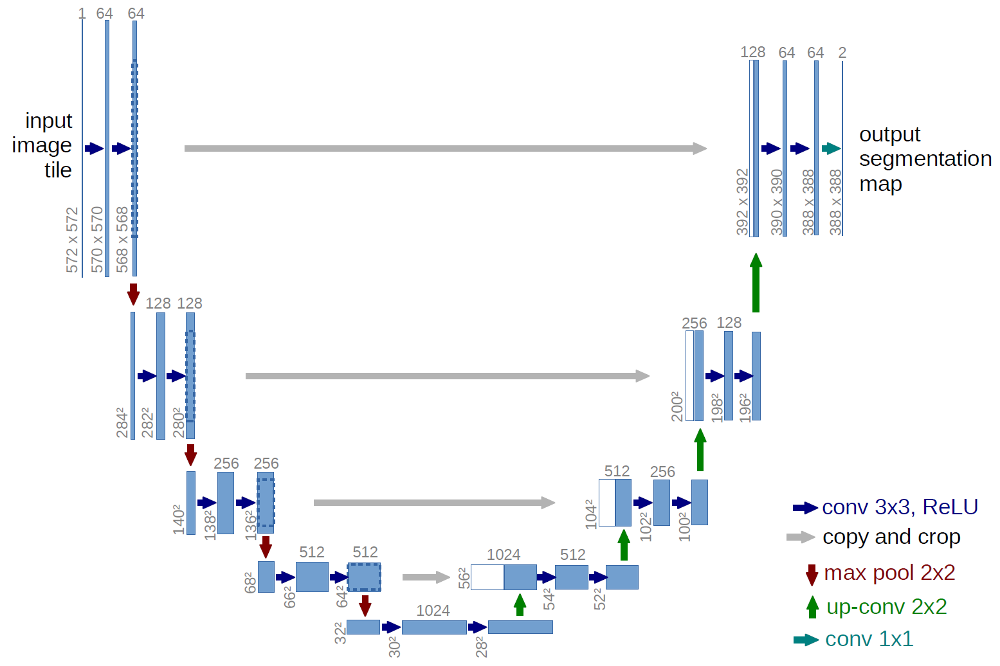

Image source: https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/u-net-architecture.png

Initially we began with a 
basic UNet model adaptation: 

The model consists of 4 downsampling blocks followed by 3 blocks for upsampling. Each sequential block has a Conv2d, Relu activation and another Conv2d followed by Relu activation. The input is passed to a Preconvolution layer which changes the image size to 3,96,96 and then feeds it into the model. The model is adapted accordingly to output the predicted mask which has a size of 4,96,96, where 4 represents the different classes. [15]




The implementation is as follows:

In [ ]:
#UNET_Modified1


from torchsummary import  summary
import torch
import torch.nn as nn
import torch.nn.functional as F

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('device  :',device)

def double_conv(in_channels, out_channels, mid_channels = None):
  if not mid_channels:
    mid_channels = out_channels
  return nn.Sequential(
              nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1),
              nn.ReLU(inplace=True),
              nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1),
              nn.ReLU(inplace=True)
       ) 



class UNet_Modified(nn.Module):

    def __init__(self, n_class=4):
      super().__init__()

      self.dconv_pre = double_conv(1,3)       
      self.dconv_down1 = double_conv(3, 64)
      self.dconv_down2 = double_conv(64, 128)
      self.dconv_down3 = double_conv(128, 256)
      self.dconv_down4 = double_conv(256, 512) 
      # self.dconv_down5 = double_conv(512, 1024)       

      self.maxpool = nn.MaxPool2d(2)
      self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)        
      
      self.dconv_up3 = double_conv(256 + 512, 256)
      self.dconv_up2 = double_conv(128 + 256, 128)
      self.dconv_up1 = double_conv(128 + 64, 64)
        
      self.conv_last = nn.Conv2d(64, n_class, 1)
        
        
    def forward(self, x):

      convpre = self.dconv_pre(x) #not maxpooling here
      conv1 = self.dconv_down1(convpre)
      x = self.maxpool(conv1)

      conv2 = self.dconv_down2(x)
      x = self.maxpool(conv2)
        
      conv3 = self.dconv_down3(x)
      x = self.maxpool(conv3)   
        
      x = self.dconv_down4(x)
        
      x = self.upsample(x)        
      x = torch.cat([x, conv3], dim=1)
        
      x = self.dconv_up3(x)
      x = self.upsample(x)        
      x = torch.cat([x, conv2], dim=1)       

      x = self.dconv_up2(x)
      x = self.upsample(x)        
      x = torch.cat([x, conv1], dim=1)   
        
      x = self.dconv_up1(x)
        
      out = self.conv_last(x)
        
      return out


        #https://github.com/usuyama/pytorch-unet/blob/master/pytorch_unet.py

model_UNET1 = UNet_Modified() # We can now create a model using your defined segmentation model
model_UNET1 = model_UNET1.to(device)
print(model_UNET1)
summary(model_UNET1,input_size=(1,96,96),batch_size=4)

device  : cuda
UNet_Modified(
  (dconv_pre): Sequential(
    (0): Conv2d(1, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(3, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (dconv_down1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (dconv_down2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (dconv_down3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (dconv_down4

Upon experimentation, it was observed that addition of BatchNormalisation [16] between the Conv2d layers and Activation layers increases the stability of the model by increasing the hidden layers. The initial model above is modified and renamed as UNET_Modified2. Also, we have removed the convpre layer which was unneccessary, we pass our input (1,96,96) directly to the constructed model and downscale it gradually as per our needs.


The UNET_Modified2 implementation is as follows:

In [ ]:
#UNET_Modified2
from torchsummary import  summary
import torch
import torch.nn as nn
import torch.nn.functional as F

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('device  :',device)

def double_conv(in_channels, out_channels, mid_channels = None):
    if not mid_channels:
            mid_channels = out_channels
    return nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
    )   

class UNet_Modified2(nn.Module):

    def __init__(self, n_class=4):
        super().__init__()
        
  
        self.dconv_down1 = double_conv(1, 64, 3) 
        self.dconv_down2 = double_conv(64, 128)
        self.dconv_down3 = double_conv(128, 256)
        self.dconv_down4 = double_conv(256, 512) 
       #self.dconv_down5 = double_conv(512, 1024)       

        self.maxpool = nn.MaxPool2d(2)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)        
        
        self.dconv_up3 = double_conv(256 + 512, 256)
        self.dconv_up2 = double_conv(128 + 256, 128)
        self.dconv_up1 = double_conv(128 + 64, 64)
        
        self.conv_last = nn.Conv2d(64, n_class, 1)
        
        
    def forward(self, x):


        conv1 = self.dconv_down1(x)
        x = self.maxpool(conv1)

        conv2 = self.dconv_down2(x)
        x = self.maxpool(conv2)
        
        conv3 = self.dconv_down3(x)
        x = self.maxpool(conv3)   
        
        x = self.dconv_down4(x)
        
        x = self.upsample(x)        
        x = torch.cat([x, conv3], dim=1)
        
        x = self.dconv_up3(x)
        x = self.upsample(x)        
        x = torch.cat([x, conv2], dim=1)       

        x = self.dconv_up2(x)
        x = self.upsample(x)        
        x = torch.cat([x, conv1], dim=1)   
        
        x = self.dconv_up1(x)
        
        out = self.conv_last(x)
        
        return out

        #https://github.com/usuyama/pytorch-unet/blob/master/pytorch_unet.py

model_UNET2 = UNet_Modified2() # We can now create a model using your defined segmentation model
model_UNET2 = model_UNET2.to(device)
print(model_UNET2)
summary(model_UNET2,input_size=(1,96,96),batch_size=4)

device  : cuda
UNet_Modified2(
  (dconv_down1): Sequential(
    (0): Conv2d(1, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(3, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (dconv_down2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (dconv_down3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(256, ep

###2.2 Transfer Learning Approach
We explored the transfer learning methods to improve the prediction score. Transfer learning [17] is using pretrained models with their respective weights trained on large datasets and then train it on our model. We use models with U-Net architecture as the base model. We use a third-party python library - Segmentation Models [2] that implements Segmentation models with pre-trained backbones in PyTorch. The library provides us with a wide range of state-of-the-art Model architectures such as Deeplab, UNet, FPN, etc. along with a large number of pre-trained encoders with weights from different datasets/training methods like imagenet, imagenet+background, imagenet+5k etc. Picking a pre-trained model is as simple as calling a function with the model architecture, encoder weights, number of input channels, and number of classes. The returned pre-trained model accepts inputs of size [N,C,H,W] and gives an output mask of size [Class,H,W]. We now load this model in training mode and run our training on this model, refining the weights to solve our particular problem. The advantage of Transfer Learning implemented above is that the model training starts with known low-level feature extractors which have been trained on huge datasets and hence we have a tremendous headstart over the models being trained from scratch, as a result, the training converges faster and uses lesser epochs. The library also provides implementations of a variety of loss functions such as DiceLoss [4] and SoftCrossEntropyLoss.

2.2.1 EfficientNet B4 architecture [11]:


Image source: https://towardsdatascience.com/complete-architectural-details-of-all-efficientnet-models-5fd5b736142

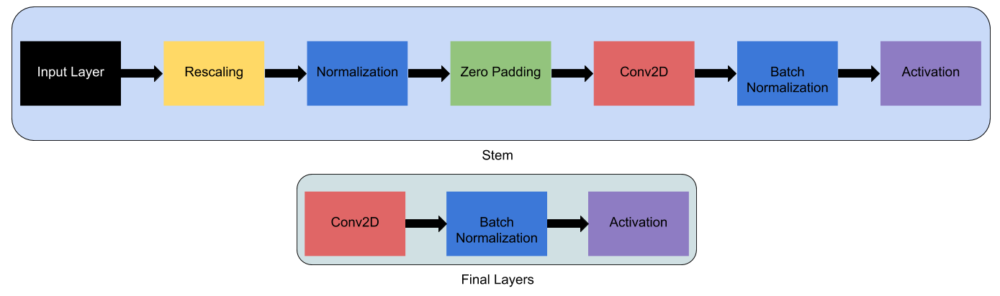

There are five types of modules used to construct the seven blocks as  shown in the figure below:
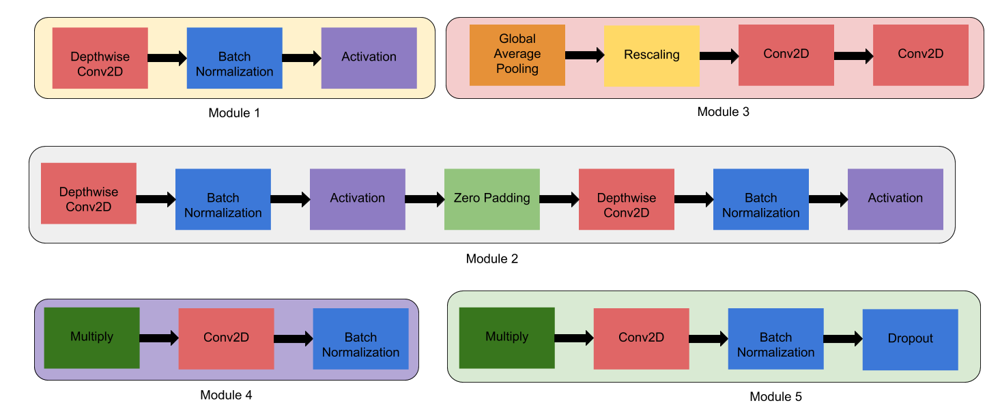

The Efficient model B4 architecture is as follows:
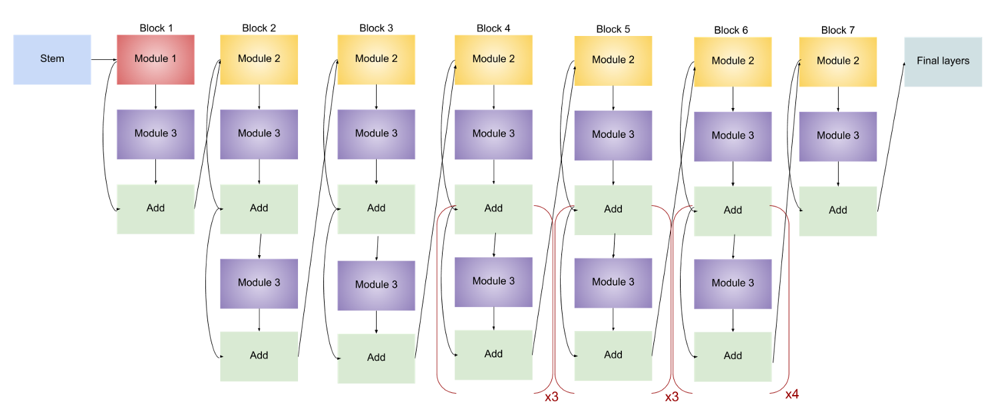

In [ ]:
#Run this to install, import and use Pytorch default Segmentation models
!pip install segmentation_models_pytorch
!pip install albumentations

     |████████████████████████████████| 88 kB 3.1 MB/s 
     |████████████████████████████████| 376 kB 11.9 MB/s 
     |████████████████████████████████| 58 kB 5.9 MB/s 
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.6.3-py3-none-any.whl size=12421 sha256=b44357ccf1bceff15f7f46aaa51558398b52317acc20a7c21432b1e57c8ff409
  Stored in directory: /root/.cache/pip/wheels/90/6b/0c/f0ad36d00310e65390b0d4c9218ae6250ac579c92540c9097a
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60965 sha256=b5c70db38080553351e4b782e2c2062442f43cb41082d3f2dd9a63b02841a7dc
  Stored in directory: /root/.cache/pip/wheels/ed/27/e8/9543d42de2740d3544db96aefef63bda3f2c1761b3334f4873
Successfully built efficientnet-pytorch pretrainedmodels


The Efficient-Net B4 model is as follows:

In [ ]:
model_efficientnet_b4 = smp.Unet(
    encoder_name="efficientnet-b4",        # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=1,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=4,                      # model output channels (number of classes in your dataset)
)
model_efficientnet_b4

Unet(
  (encoder): EfficientNetEncoder(
    (_conv_stem): Conv2dStaticSamePadding(
      1, 48, kernel_size=(3, 3), stride=(2, 2), bias=False
      (static_padding): ZeroPad2d(padding=(0, 1, 0, 1), value=0.0)
    )
    (_bn0): BatchNorm2d(48, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
    (_blocks): ModuleList(
      (0): MBConvBlock(
        (_depthwise_conv): Conv2dStaticSamePadding(
          48, 48, kernel_size=(3, 3), stride=[1, 1], groups=48, bias=False
          (static_padding): ZeroPad2d(padding=(1, 1, 1, 1), value=0.0)
        )
        (_bn1): BatchNorm2d(48, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
        (_se_reduce): Conv2dStaticSamePadding(
          48, 12, kernel_size=(1, 1), stride=(1, 1)
          (static_padding): Identity()
        )
        (_se_expand): Conv2dStaticSamePadding(
          12, 48, kernel_size=(1, 1), stride=(1, 1)
          (static_padding): Identity()
        )
        

2.2.2 Modification of Dataloaders for Data Augmentation.
We modify the given data loaders to better suit our use cases. Specifically, for

Train DataSet :
We change the given training dataset class to incorporate a custom third-party data augmentation library called Albumentations [5]. We use some basic image transformations from this library such as rotate, flip, shift, and scale to augment our images and corresponding masks. We write a composite transform including all these transformations. Using Image augmentation allows us to expand our dataset and better generalize on our training dataset. One other change made in the Train DataSet is the addition of an extra dimension to the images and masks since the old dataloader gives images of shape : (H x W) and not (C x H x W) i.e is the standard usage (also specified in the question, where C=1 since greyscale).

ValDataset:
Since we need a Data Loader for loading the Validation Set, and since the training DataSet now includes augmentations/transformations, we write a new DataSet class for Validation testing. This also includes the dimension expansion as in the previous class.

Test DataSet:
This is almost the same as the one given except for the dimension expansion change similar to the other two. We also add an extra return variable 'img_path' in the getitem function to return the current image path to simplify the submission process.

In [ ]:
from torch.utils.data import DataLoader
import torch,numpy as np
import torch.utils.data as data
import cv2
import os
from glob import glob
import albumentations as A

transform = A.Compose([
        A.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=30, p=0.5,border_mode=1),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
    
])

class TrainDatasetModified(data.Dataset):
    def __init__(self, root=''):
        super(TrainDatasetModified, self).__init__()
        self.img_files = glob(os.path.join(root,'image','*.png'))
        self.mask_files = []
        for img_path in self.img_files:
            basename = os.path.basename(img_path)
            self.mask_files.append(os.path.join(root,'mask',basename[:-4]+'_mask.png'))
            

    def __getitem__(self, index):
            global transform
            img_path = self.img_files[index]
            mask_path = self.mask_files[index]
            data = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
            label = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
            transformed =  transform(image=data,mask=label)
            return torch.from_numpy(np.expand_dims(transformed['image'],axis=0)).float(), torch.from_numpy(transformed['mask']).float()

    def __len__(self):
        return len(self.img_files)
    
    
class ValDatasetModified(data.Dataset):
    def __init__(self, root=''):
        super(ValDatasetModified, self).__init__()
        self.img_files = glob(os.path.join(root,'image','*.png'))
        self.mask_files = []
        for img_path in self.img_files:
            basename = os.path.basename(img_path)
            self.mask_files.append(os.path.join(root,'mask',basename[:-4]+'_mask.png'))
            

    def __getitem__(self, index):
            global transform
            img_path = self.img_files[index]
            mask_path = self.mask_files[index]
            data = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
            label = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
            
            return torch.from_numpy(np.expand_dims(data,axis=0)).float(), torch.from_numpy(label).float()

    def __len__(self):
        return len(self.img_files)
    
class TestDatasetModified(data.Dataset):
    def __init__(self, root=''):
        super(TestDatasetModified, self).__init__()
        self.img_files = glob(os.path.join(root,'image','*.png'))

    def __getitem__(self, index):
            img_path = self.img_files[index]
            data = np.expand_dims(cv2.imread(img_path, cv2.IMREAD_UNCHANGED), axis=0)
            return torch.from_numpy(data).float() , img_path

    def __len__(self):
        return len(self.img_files)

###2.3 Helper Code for data loader and submission already provided to approach the problem at hand. 

In [ ]:
# The following snippet helps in mounting the google drive for data set
# show image mask function is used for visulising images
#data loaders for loading the train , val and test datasets

from google.colab import drive
import torch
import os
import cv2 #import OpenCVfrom matplotlib import pyplot as plt
import matplotlib.pyplot as plt
from glob import glob
import torch.utils.data as data

drive.mount('/content/drive')


#This is for Visualising the mask
def show_image_mask(img, mask, cmap='gray'): # visualisation
    fig = plt.figure(figsize=(5,5))
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap=cmap)
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap=cmap)
    plt.axis('off')


path = '/content/drive/MyDrive/data/train'

class TrainDataset(data.Dataset):
    def __init__(self, root=path):
        super(TrainDataset, self).__init__()
        self.img_files = glob(os.path.join(root,'image','*.png'))
        #print(self.img_files)
        self.mask_files = []
        #print(self.img_files)
        for img_path in self.img_files:
            basename = os.path.basename(img_path)
            self.mask_files.append(os.path.join(root,'mask',basename[:-4]+'_mask.png'))
            

    def __getitem__(self, index):
            img_path = self.img_files[index]
            mask_path = self.mask_files[index]
            data = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
            label = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
            return torch.from_numpy(data).float(), torch.from_numpy(label).float()    #tensor vlaues for data( image) and label( mask) is returned.

    def __len__(self):
        return len(self.img_files)

class TestDataset(data.Dataset):
    def __init__(self, root=''):
        super(TestDataset, self).__init__()
        self.img_files = glob(os.path.join(root,'image','*.png'))

    def __getitem__(self, index):
            img_path = self.img_files[index]
            data = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
            return torch.from_numpy(data).float(),img_path              #Returning the image path for further use

    def __len__(self):
        return len(self.img_files)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np
import os
import cv2

def rle_encoding(x):
    '''
    *** Credit to https://www.kaggle.com/rakhlin/fast-run-length-encoding-python ***
    x: numpy array of shape (height, width), 1 - mask, 0 - background
    Returns run length as list
    '''
    dots = np.where(x.T.flatten() == 1)[0]
    run_lengths = []
    prev = -2
    for b in dots:
        if (b > prev + 1): run_lengths.extend((b + 1, 0))
        run_lengths[-1] += 1
        prev = b
    return run_lengths


def submission_converter(mask_directory, path_to_save):
    writer = open(os.path.join(path_to_save, "submission.csv"), 'w')
    writer.write('id,encoding\n')

    files = os.listdir(mask_directory)

    for file in files:
        name = file[:-4]
        mask = cv2.imread(os.path.join(mask_directory, file), cv2.IMREAD_UNCHANGED)

        mask1 = (mask == 1)
        mask2 = (mask == 2)
        mask3 = (mask == 3)

        encoded_mask1 = rle_encoding(mask1)
        encoded_mask1 = ' '.join(str(e) for e in encoded_mask1)
        encoded_mask2 = rle_encoding(mask2)
        encoded_mask2 = ' '.join(str(e) for e in encoded_mask2)
        encoded_mask3 = rle_encoding(mask3)
        encoded_mask3 = ' '.join(str(e) for e in encoded_mask3)

        writer.write(name + '1,' + encoded_mask1 + "\n")
        writer.write(name + '2,' + encoded_mask2 + "\n")
        writer.write(name + '3,' + encoded_mask3 + "\n")

    writer.close()

###2.4 Model Training and Validation in single function.
We have created a single function to train and validate the models over the epochs. The function returns a trained model which can be saved and deployed for future predictions on test data. We are also plotting the train loss and validation loss over epochs, providing useful insights about training and validation process. 

In [ ]:
from torch.utils.data import DataLoader
from collections import defaultdict
import time
import argparse
import torch.nn.functional as F
import torch.nn as nn
import matplotlib.pyplot as plt
import torch.optim as optim
from torch.optim import lr_scheduler

val_data_path = '/content/drive/MyDrive/data/val'
data_path = '/content/drive/MyDrive/data/val'

num_workers = 4
batch_size = 4
epoch_train_losses=[]
epoch_val_losses = []
val_set = TrainDataset(val_data_path)  #Change
val_data_loader = DataLoader(dataset=val_set, num_workers=num_workers,batch_size=batch_size, shuffle=False)
train_set = TrainDataset(data_path)
training_data_loader = DataLoader(dataset=train_set, num_workers=num_workers, batch_size=batch_size, shuffle=True)

def plot_losses(epoch_train_losses, epoch_val_losses): 
  plt.plot(epoch_train_losses, 'b-',label='Taining Losses')
  plt.plot(epoch_val_losses, color='orange',label='Validation Losses')
  plt.xlabel('Epochs')
  plt.ylabel('Error')
  plt.legend()
  plt.show()


def train_and_validate(model,
              device,
              optimizer,
              epochs: int =10,
              batch_size: int = 1,
              learning_rate: float = 3e-4,
              criterion = nn.CrossEntropyLoss(),
):
  epoch_train_losses.clear() # Here we clear the list for any previous run losses stored to get correct new list and graph
  epoch_val_losses.clear()
  if isinstance(criterion,torch.nn.Module): ##just to be sure that criterion is on the correct device.
    criterion.to(device)
  for epoch in range(epochs) :
    #torch.set_grad_enabled(True)
    since = time.time() 
    train_loss = 0.0
    model.train()
    for iteration, sample in enumerate(training_data_loader):
        img, mask = sample
        img=img.unsqueeze(1)
        img  = img.to(device = device)
        #https://discuss.pytorch.org/t/only-batches-of-spatial-targets-supported-non-empty-3d-tensors-but-got-targets-of-size-1-1-256-256/49134/18 
        mask = mask.squeeze(1)
        mask = mask.to(device,dtype = torch.long)      
        out  = model(img)
        #print(out.shape)
        optimizer.zero_grad()
        scheduler = lr_scheduler.StepLR(optimizer,step_size=30,gamma=0.1),
        #dice_loss = dice_coef_binary_loss(mask,out)
        #dice= dice_loss(F.softmax(out, dim=1).float(), F.one_hot(mask, 4).permute(0, 3, 1, 2).float(),multiclass=True)
        #loss = dice

    # Then write your BACKWARD & OPTIMIZE below
    # Note: Compute Loss and Optimize
        loss = criterion (out,mask) 
        loss.backward()
        optimizer.step()
        train_loss += loss.item()

     #   print('train loss',loss.item(),' step :',global_step,' epoch :',epoch)
    
    val_loss =0.0
    model.eval()
    for image,mask in val_data_loader:
      #print(image.shape,mask.shape)
      image = image.to(device)
      image = image.unsqueeze(1)
      mask = mask.to(device,dtype = torch.long)

      out = model(image)
      loss = criterion(out,mask.long())
      val_loss += loss.item() * image.size(0)
      out_np = torch.max(out,1).indices.cpu().detach().numpy()

    epoch_train_losses.append(train_loss / len(train_set))
    epoch_val_losses.append(val_loss/len(val_set))
    print(f'Epoch {epoch+1} \t\t Training Loss: {train_loss / len(train_set)} \t\t Validation Loss: {val_loss / len(val_set)}')
  plot_losses(epoch_train_losses, epoch_val_losses)
  return model

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


#3.Experimentation



##3.1 Overview

The UNET_Modified1 model was trained on the data. The loss function selected was CrossEntropyLoss with RMSProp optimizer. This model was primitive version of UNET and thus caused oscillations in the training loss, as observed in the graph below.


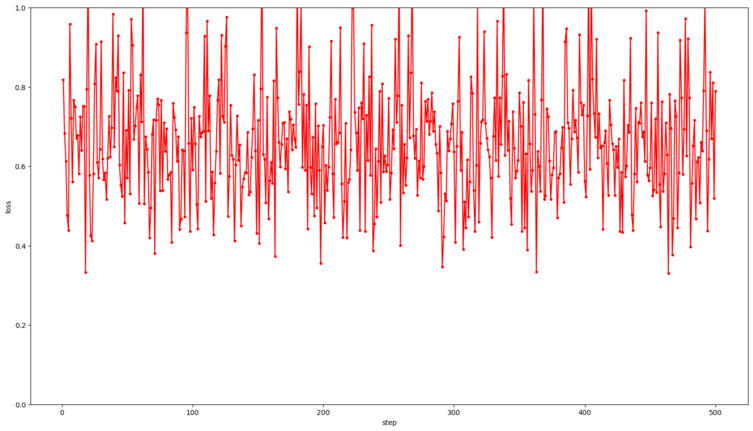

The above graph (Loss vs Step), indicates poor performance. To overcome this unstability we constructed another model with BatchNormalisation layer between each Conv2d and RELU layer within encoder and decoder blocks. BatchNormalisation supposedly increased the stability of the model. The resulting UNET architecture obtained was called as UNET_Modified2. Initially, we trained this model for 10 epochs. The loss function was CrossEntropyloss with RMSProp Optimiser. Despite a significant decrease in the training loss and strengthening of the model, oscillations persisted. To solve this, we tried exploring other optimizer function and selected 'Adam' [9]. The model was retrained for 25 epochs and observed following training loss for each step:

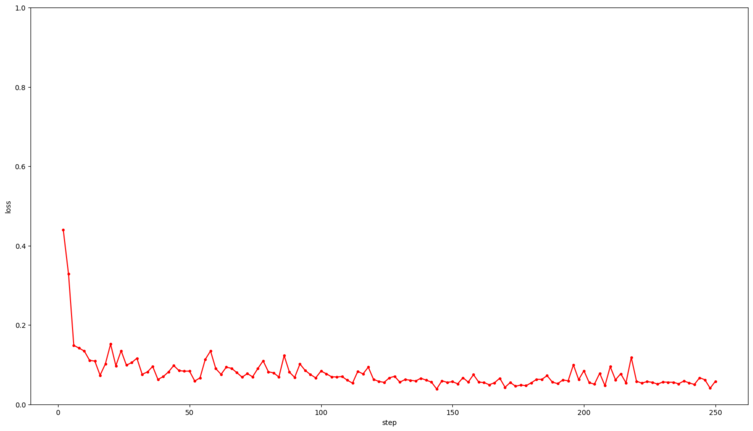

The oscillations were dampened. This was a strong evidence to go ahead with the Adam optimiser and CrossEntropyLoss.

Further, we merged the training and validation code under a single function. For each epoch, the model was put into trained mode and trained on the training dataset and immediately validated in eval mode using the validation dataset. This helped us analyse the behaviour of the model and its learning and validation for every epoch.

The performance of the UNET_Modified2 model with the RMSProp optimiser, learning rate tuned to 0.000001 and CrossEntropyLoss can be visualised as follows :


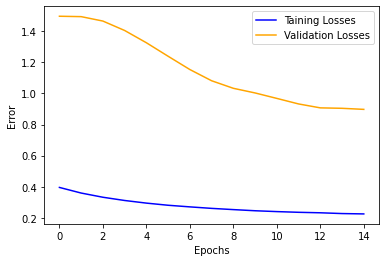

We can observe that, the gap between the training loss and validation loss is big and non-convergent. This justifies our choice of Adam over RMSProp as the optimizer function.
Visualisation of the Training and Validation loss on UNET_Modified2 model with Adam optimiser and CrossEntropyLoss function. The experimental learning rate is selected as 3e-4 is as follows :

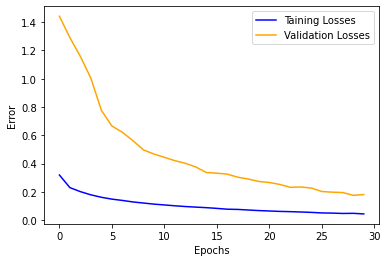

It can be clearly seen that the gap between training and validation loss closes in as the number of epochs increase. We select 30 epochs as optimal to avoid any overfitting of the training data. It was observed that the some of the test data predicitons were poor. The submission score in kaggle for our predicitons using UNET_Modified2 was around 69%. To improve our results, we switched to transfer learning.


---



Under the transfer learning approach we explored and decided to use segmentation_models_pytorch. The library, contains different encoders based on UNET modifications with pretrained weights on huge datasets. Initially, RESNET50 Encoder was selected and trained on our dataset. It was observed that the predictions were better than the previous experiments. After kaggle submission we achieved a score of 72%. The train loss vs validation loss is as follows:

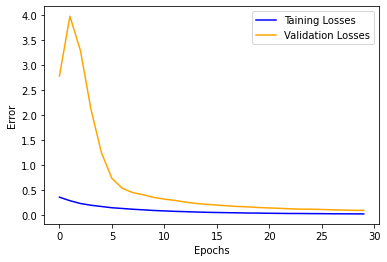

We infered that the RESNET50 has high number of parameters which may be overwhemling for our small dataset. RESNET34 encoder was selected next as it had fewer parameters. It was seen that the prediction was poor as compared to our previous experiments and got a Kaggle score of 68%.


---


The models experimented so far can be compared as :

UNET_MODIFIED1 < UNET+ RESNET34 < UNET_MODIFIED2 < UNET + RESNET50.


---


To further improve prediction score, new transfer learning models [13] which are lightweight and be able to provide state of the art segmentation results were explored; which led to Efficient Net Models. We used EfficientNet B4 encoder (because of its balance between number of parameters and accuracy) model to do the transfer learning and train on our data. To increase the performance of the training process we performed data augmentation to increase the training dataset and a better convergence was observed After training we obtained The graph of Train vs validation loss over epoch as shown below, and we observe good convergence :
With increasing epochs, validation loss approaches training loss.

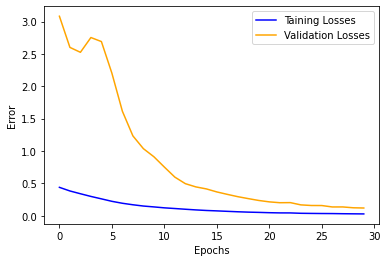

It can be infered that the model formulated is satisfactory and 30 epochs are sufficient for the model to learn about the important features for the given image segmentation task. With this model we were able to achieve a good score of 89% on the Kaggle competition.

### **Loss Function Experimentations**


For training our models until now, we have been using the standard CrossEntropy loss provided by pytorch. However, the loss mostly became stagnant after a certain number of epochs and the training wasn't proceeding any further. Different optimizers were also used such as Adam, RMSprop, SGD, Adagrad etc. with different learning rates and other hyperparameters but there seemed to be no effect on the training loss. On exploring other loss functions for segmentation tasks, we came across another Loss function - DiceLoss - from the same Segmentation library where we got our pretrained model. Using the log_loss (-log(dice_coeff)) mode of the multiclass dice loss, we were able to learn and reduce the loss even more when we started training on the best model trained using CrossEntropy loss. One other reason for choosing this loss function is that the final evaluation is going to be done using dice loss [4].

##3.2 Expermentation Snippets

### 3.2.1 Training our UNET_Modified2 with CrossEntropy Loss Function and RMSProp for 15 Epochs:

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 1 		 Training Loss: 0.3951525866985321 		 Validation Loss: 1.4971521377563477
Epoch 2 		 Training Loss: 0.3589699923992157 		 Validation Loss: 1.4946292400360108
Epoch 3 		 Training Loss: 0.3319499671459198 		 Validation Loss: 1.4661351442337036
Epoch 4 		 Training Loss: 0.3110720694065094 		 Validation Loss: 1.4054841995239258
Epoch 5 		 Training Loss: 0.2941943287849426 		 Validation Loss: 1.3265290975570678
Epoch 6 		 Training Loss: 0.2803572952747345 		 Validation Loss: 1.239547848701477
Epoch 7 		 Training Loss: 0.26995337605476377 		 Validation Loss: 1.1540952682495118
Epoch 8 		 Training Loss: 0.260320258140564 		 Validation Loss: 1.0819128036499024
Epoch 9 		 Training Loss: 0.2524142175912857 		 Validation Loss: 1.0332825660705567
Epoch 10 		 Training Loss: 0.24502223432064058 		 Validation Loss: 1.0033661007881165
Epoch 11 		 Training Loss: 0.23959235846996307 		 Validation Loss: 0.9682387351989746
Epoch 12 		 Training Loss: 0.2350277066230774 		 Validation Loss: 0.93261

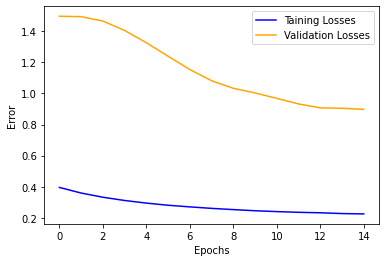

In [ ]:
#Training with Final UNET model with Optimiser as RMS PROP, passed directly as arguments.
lr_rate = 0.000001
batch_size = 4
model = model_UNET2
learned_model = train_and_validate(model ,device, optim.RMSprop(model.parameters(), lr=lr_rate, weight_decay=1e-8, momentum=0.9), 15, batch_size,  learning_rate=lr_rate)

**Observation:** There was no convergence occuring when we are using RMS prop optimiser. We decided to use different optimiser function


### 3.2.2 Training our UNET_Modified2 with CrossEntropy Loss Function and ADAM for 30 Epochs:

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 1 		 Training Loss: 0.31920231580734254 		 Validation Loss: 1.4411213874816895
Epoch 2 		 Training Loss: 0.23019555509090422 		 Validation Loss: 1.2895204067230224
Epoch 3 		 Training Loss: 0.20181494057178498 		 Validation Loss: 1.1568560600280762
Epoch 4 		 Training Loss: 0.17924712002277374 		 Validation Loss: 1.002943754196167
Epoch 5 		 Training Loss: 0.16192501783370972 		 Validation Loss: 0.7760198950767517
Epoch 6 		 Training Loss: 0.14897475242614747 		 Validation Loss: 0.6658252120018006
Epoch 7 		 Training Loss: 0.13973329663276673 		 Validation Loss: 0.6209753632545472
Epoch 8 		 Training Loss: 0.12913629561662673 		 Validation Loss: 0.5627557158470153
Epoch 9 		 Training Loss: 0.12139071524143219 		 Validation Loss: 0.4969793200492859
Epoch 10 		 Training Loss: 0.11371890753507614 		 Validation Loss: 0.46767467856407163
Epoch 11 		 Training Loss: 0.10788329541683198 		 Validation Loss: 0.4444044232368469
Epoch 12 		 Training Loss: 0.10191528797149658 		 Validation Lo

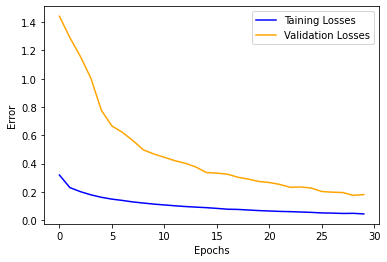

In [ ]:
lr_rate = 3e-4
batch_size = 4
model = model_UNET2
learned_model = train_and_validate(model ,device, optim.Adam(model.parameters(),lr = lr_rate), 30, batch_size,  learning_rate=lr_rate)

#### 3.2.2.1 Testing the trained model on test dataset

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr199.png


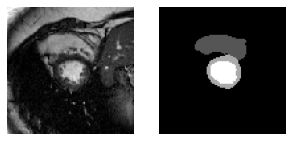

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr150.png


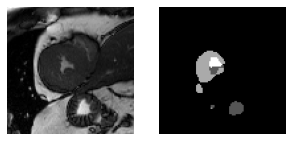

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr146.png


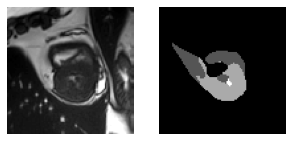

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr174.png


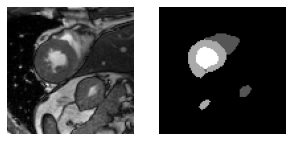

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr176.png


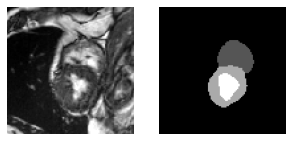

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr198.png


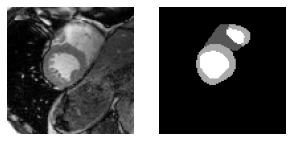

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr191.png


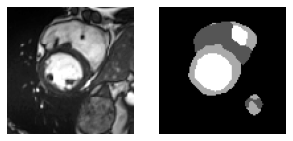

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr153.png


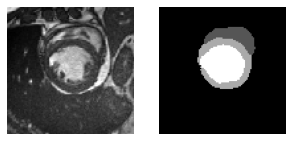

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr175.png


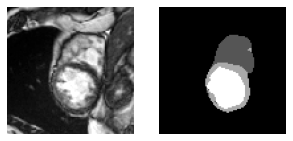

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr165.png


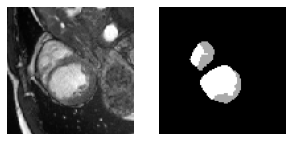

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr152.png


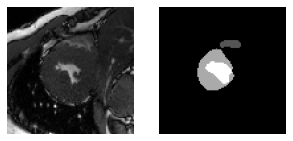

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr140.png


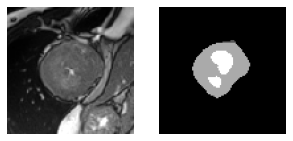

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr130.png


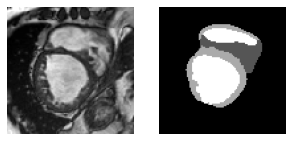

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr144.png


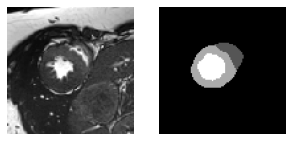

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr143.png


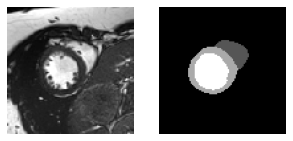

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr192.png


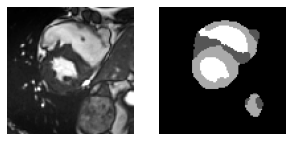

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr164.png


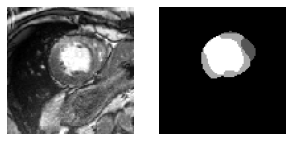

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr157.png


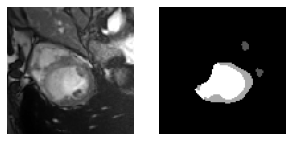

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr166.png


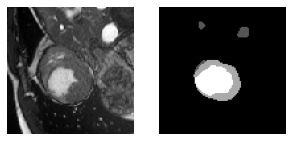

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr151.png


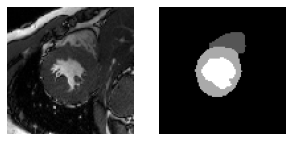

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr147.png


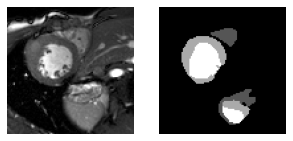

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr171.png


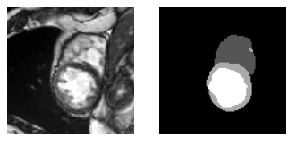

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr149.png


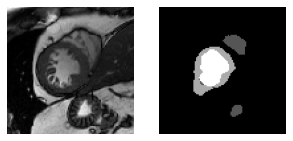

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr180.png


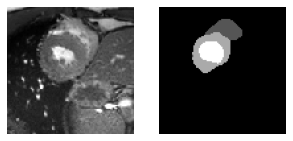

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr200.png


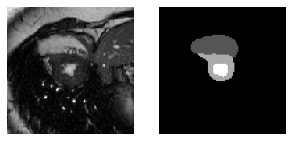

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr121.png


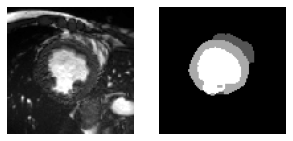

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr160.png


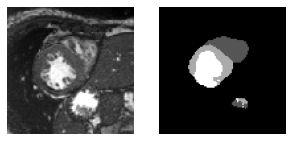

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr179.png


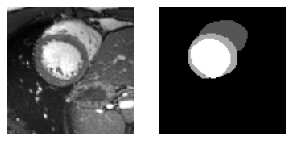

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr125.png


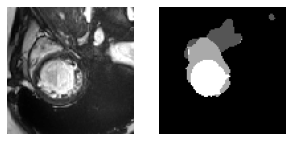

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr195.png


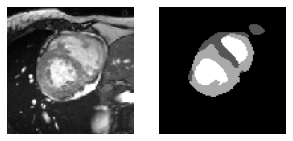

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr161.png


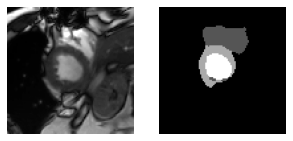

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr188.png


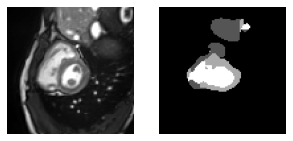

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr167.png


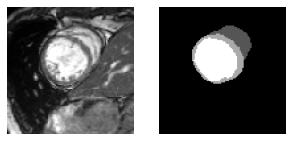

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr154.png


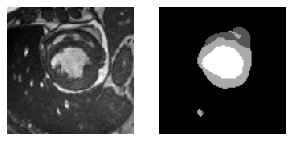

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr131.png


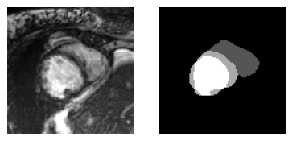

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr132.png


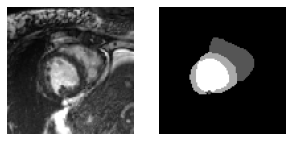

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr127.png


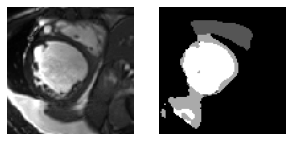

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr138.png


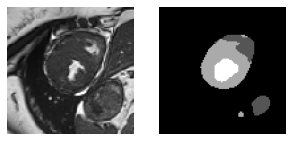

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr124.png


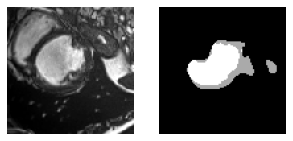

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr142.png


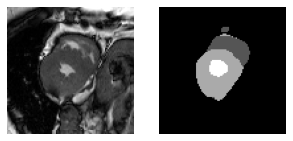

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr185.png


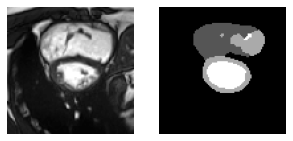

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr148.png


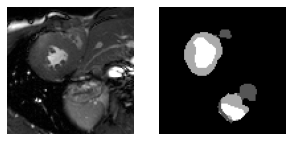

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr190.png


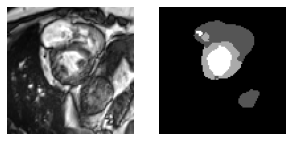

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr194.png


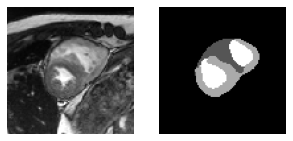

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr187.png


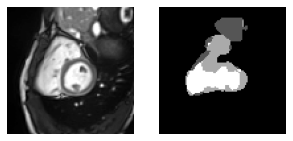

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr181.png


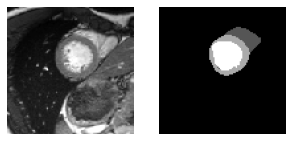

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr173.png


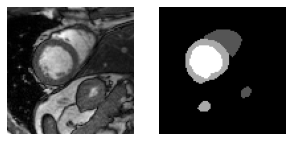

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr136.png


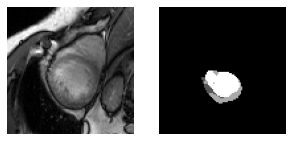

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr129.png


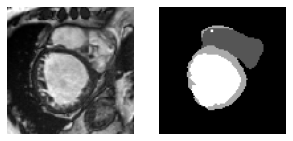

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr141.png


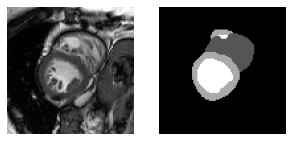

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr159.png


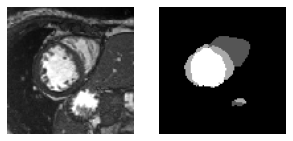

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr196.png


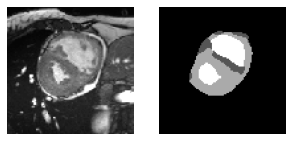

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr155.png


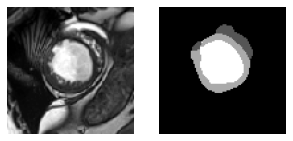

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr126.png


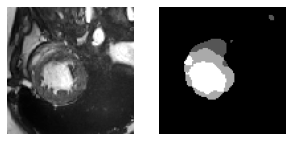

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr197.png


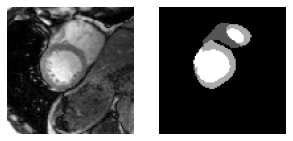

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr128.png


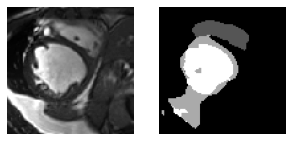

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr189.png


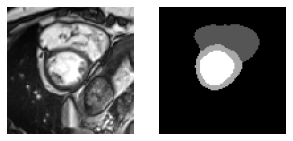

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr158.png


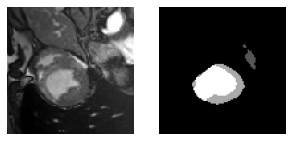

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr162.png


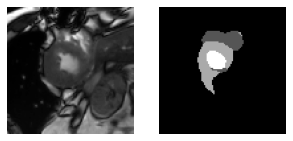

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr170.png


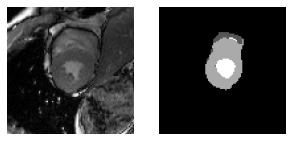

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr122.png


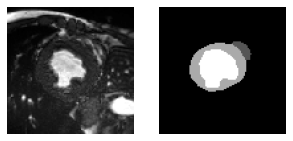

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr172.png


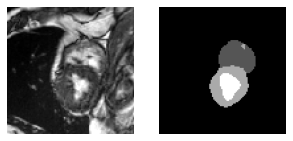

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr178.png


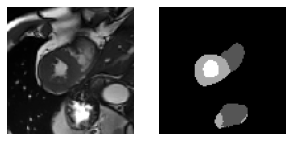

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr193.png


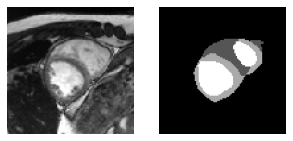

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr168.png


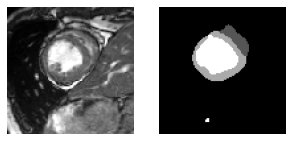

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr184.png


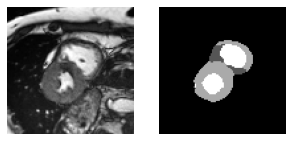

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr135.png


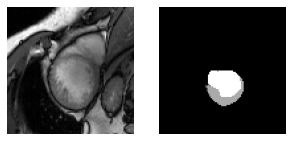

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr145.png


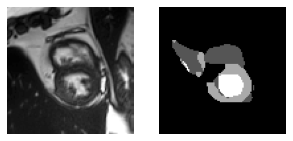

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr163.png


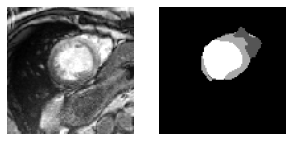

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr134.png


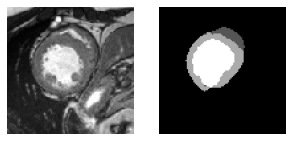

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr156.png


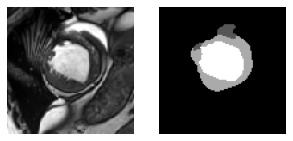

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr186.png


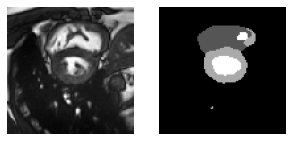

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr137.png


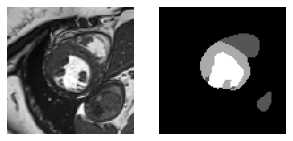

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr182.png


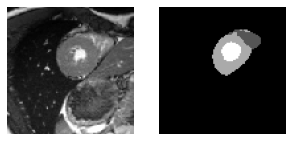

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr169.png


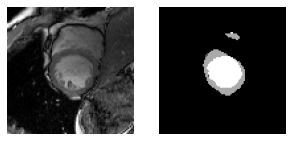

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr133.png


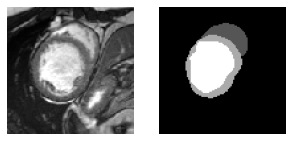

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr177.png


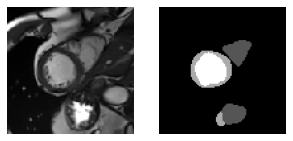

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr183.png


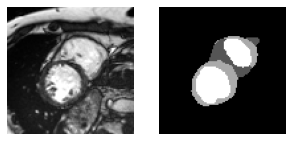

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr123.png


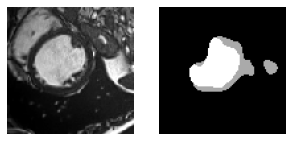

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr139.png


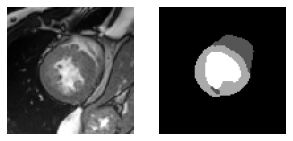

In [ ]:
 #In this block you are expected to write code to load saved model and deploy it to all data in test set to 
# produce segmentation masks in png images valued 0,1,2,3, which will be used for the submission to Kaggle.
import re
from torchvision.utils import save_image
data_path = '/content/drive/MyDrive/data/test/'
num_workers = 2
batch_size = 1
Learned_model= model
test_set = TestDataset(data_path)
test_data_loader = DataLoader(dataset=test_set, num_workers=num_workers,batch_size=batch_size, shuffle=False)
Learned_model.eval()
for iteration, sample in enumerate(test_data_loader):
    img,img_pth = sample
    #print(img.shape)
    print(img.size())
    img = img.unsqueeze(1)
    print(img.size())
    img = img.to(device)
    out = Learned_model(img)
    out_np = torch.max(out,1).indices.cpu().detach().numpy()
    image_np = img.cpu().detach().numpy()
    print(img_pth[0])
   # print(re.split(r'\/',img_pth[0]))
    #img_pth = re.split(r'\/',img_pth[0])
    #print(img_pth)
    #path = os.path.join('',img_pth[-1])
    #print(path)  
    #path=path[:6]
    #print(path)
    #cv2.imwrite('/mask/' + path, out)
    dir_to_save = '/content/mask_UNET/'
    for i in range(1):
            show_image_mask(image_np[i,0], out_np[i], cmap='gray')
            plt.pause(1)
            image_name = img_pth[i].split('/')[-1].split('.')[0]+'_mask.png'
            #print(image_name,os.path.join(output_test_mask_path,image_name))
            cv2.imwrite(os.path.join(dir_to_save,image_name),out_np[0])

### 3.2.3 Transfer learning approach using RESNET 50 and ImageNet weights. Directly tested it on the test dataset without training it on the train data.

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr199.png


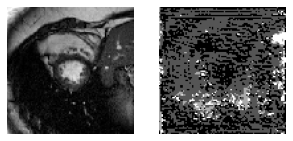

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr150.png


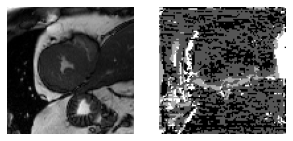

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr146.png


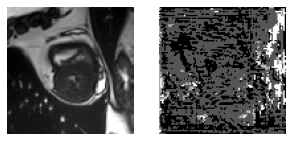

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr174.png


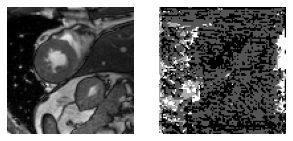

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr176.png


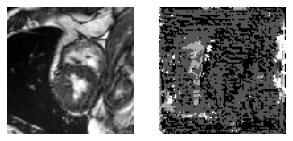

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr198.png


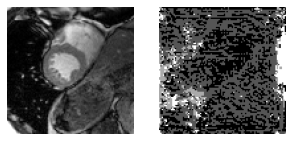

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr191.png


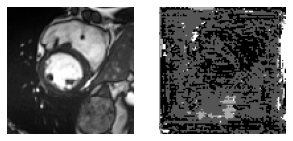

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr153.png


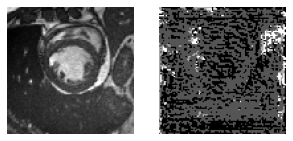

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr175.png


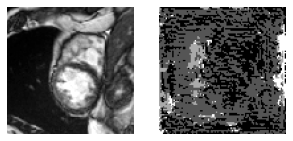

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr165.png


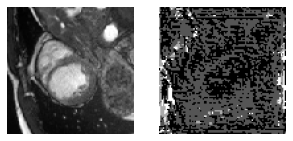

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr152.png


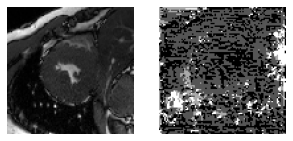

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr140.png


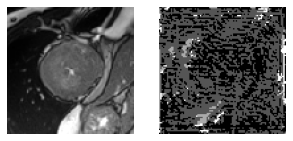

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr130.png


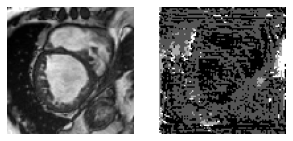

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr144.png


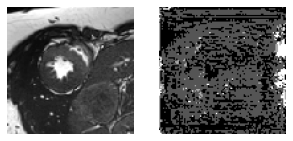

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr143.png


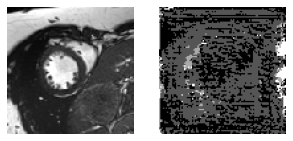

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr192.png


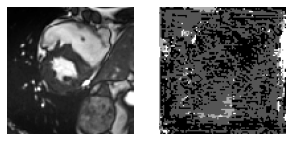

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr164.png


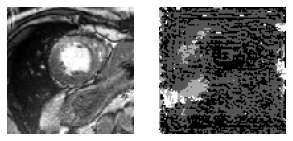

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr157.png


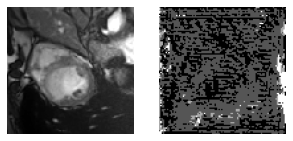

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr166.png


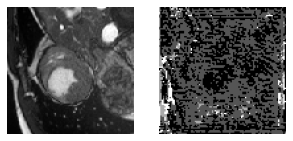

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr151.png


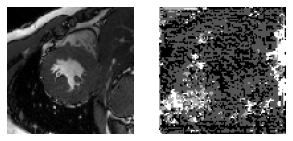

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr147.png


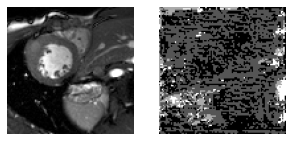

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr171.png


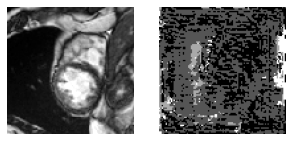

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr149.png


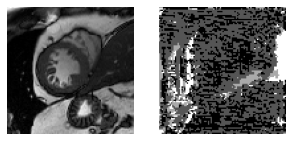

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr180.png


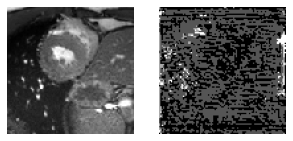

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr200.png


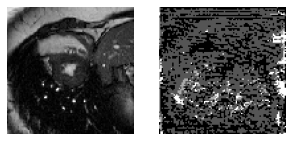

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr121.png


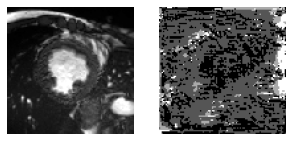

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr160.png


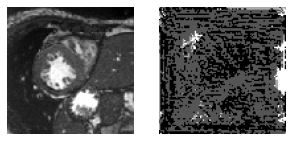

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr179.png


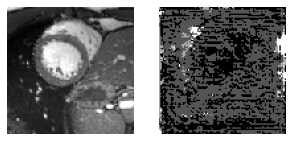

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr125.png


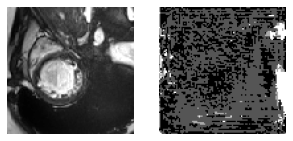

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr195.png


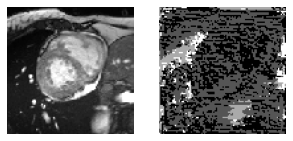

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr161.png


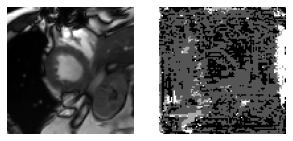

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr188.png


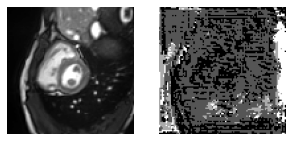

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr167.png


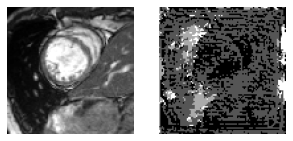

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr154.png


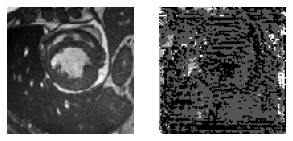

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr131.png


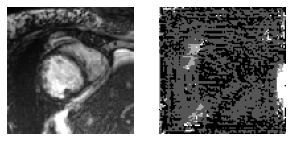

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr132.png


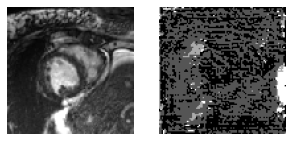

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr127.png


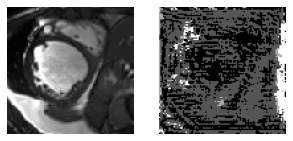

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr138.png


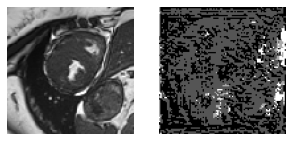

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr124.png


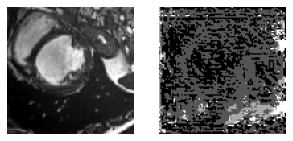

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr142.png


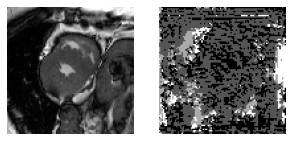

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr185.png


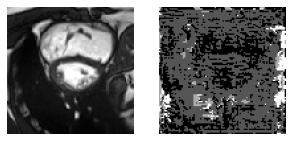

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr148.png


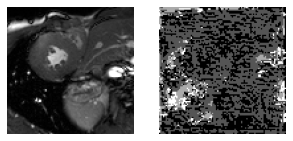

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr190.png


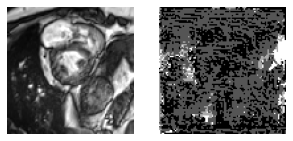

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr194.png


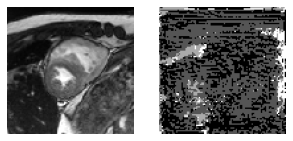

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr187.png


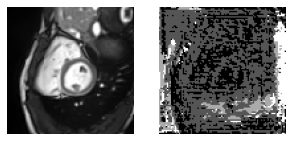

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr181.png


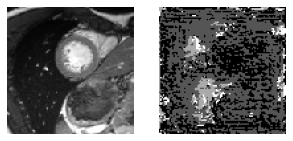

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr173.png


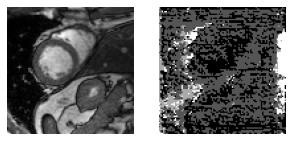

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr136.png


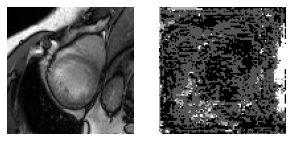

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr129.png


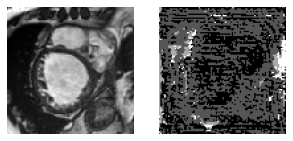

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr141.png


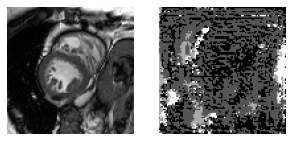

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr159.png


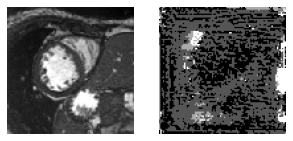

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr196.png


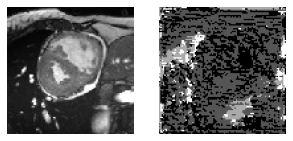

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr155.png


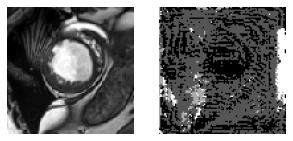

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr126.png


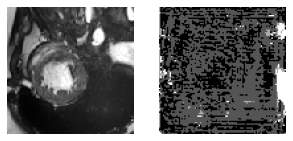

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr197.png


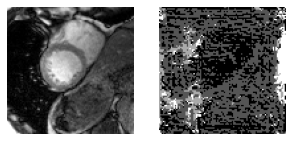

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr128.png


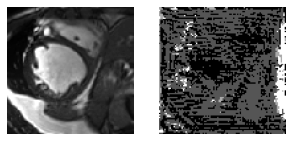

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr189.png


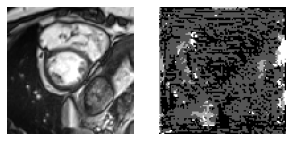

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr158.png


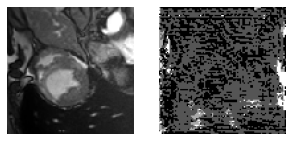

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr162.png


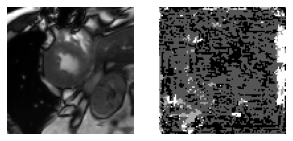

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr170.png


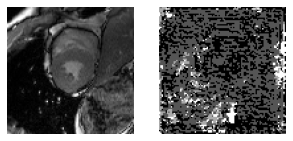

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr122.png


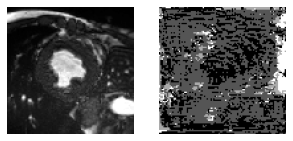

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr172.png


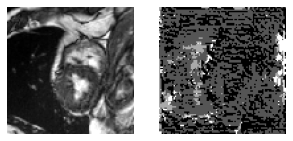

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr178.png


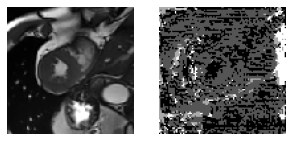

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr193.png


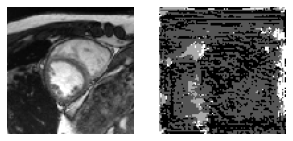

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr168.png


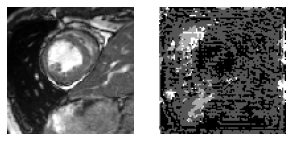

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr184.png


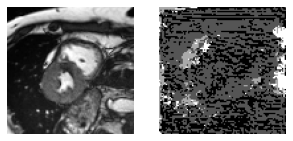

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr135.png


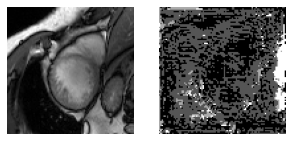

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr145.png


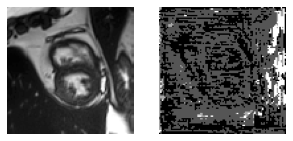

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr163.png


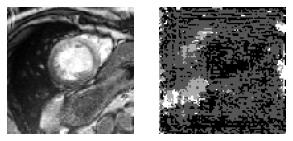

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr134.png


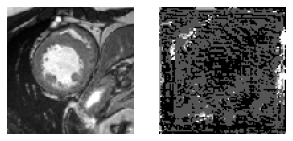

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr156.png


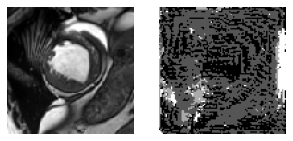

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr186.png


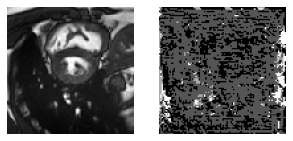

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr137.png


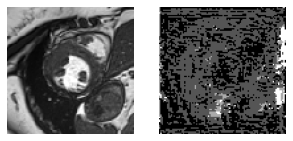

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr182.png


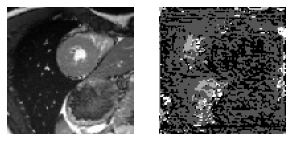

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr169.png


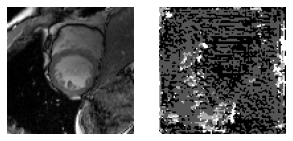

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr133.png


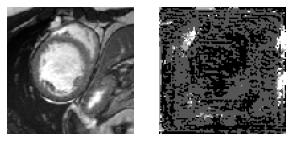

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr177.png


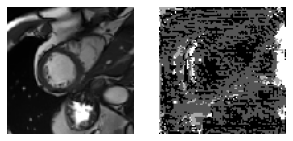

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr183.png


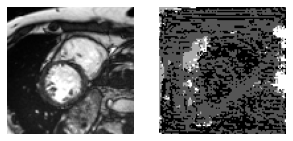

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr123.png


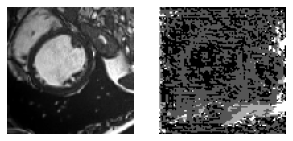

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr139.png


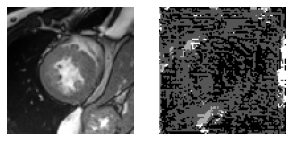

In [ ]:
 #In this block you are expected to write code to load saved model and deploy it to all data in test set to 
# produce segmentation masks in png images valued 0,1,2,3, which will be used for the submission to Kaggle.
import segmentation_models_pytorch as smp
model_resnet50 = smp.Unet(
    encoder_name="resnet50",        # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=1,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=4,                      # model output channels (number of classes in your dataset)
)
import re
from torchvision.utils import save_image
data_path = '/content/drive/MyDrive/data/test/'
num_workers = 2
batch_size = 1
Learned_model= model_resnet50
Learned_model = Learned_model.to(device)
test_set = TestDataset(data_path)
test_data_loader = DataLoader(dataset=test_set, num_workers=num_workers,batch_size=batch_size, shuffle=False)
Learned_model.eval()
for iteration, sample in enumerate(test_data_loader):
    img,img_pth = sample
    #print(img.shape)
    print(img.size())
    img = img.unsqueeze(1)
    print(img.size())
    img = img.to(device)
    out = Learned_model(img)
    out_np = torch.max(out,1).indices.cpu().detach().numpy()
    image_np = img.cpu().detach().numpy()
    print(img_pth[0])
   # print(re.split(r'\/',img_pth[0]))
    #img_pth = re.split(r'\/',img_pth[0])
    #print(img_pth)
    #path = os.path.join('',img_pth[-1])
    #print(path)  
    #path=path[:6]
    #print(path)
    #cv2.imwrite('/mask/' + path, out)
    dir_to_save = '/content/mask_UNET/'
    for i in range(1):
            show_image_mask(image_np[i,0], out_np[i], cmap='gray')
            plt.pause(1)
            image_name = img_pth[i].split('/')[-1].split('.')[0]+'_mask.png'
            #print(image_name,os.path.join(output_test_mask_path,image_name))
            cv2.imwrite(os.path.join(dir_to_save,image_name),out_np[0])

**Observation:-** The results were very poor compared to our adapted UNET model. The reason is obvious, it is a general model and not specific to out Dataset.

### 3.2.4 TRANSFER LEARNING approach:- Training our UNET with RESNET50 encoder with IMAGENET weights on the train dataset and later testing it.


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 1 		 Training Loss: 0.35732340812683105 		 Validation Loss: 2.7793089389801025
Epoch 2 		 Training Loss: 0.2867168724536896 		 Validation Loss: 3.9758352279663085
Epoch 3 		 Training Loss: 0.23074970543384551 		 Validation Loss: 3.2911332130432127
Epoch 4 		 Training Loss: 0.1961034655570984 		 Validation Loss: 2.1206143617630007
Epoch 5 		 Training Loss: 0.17093875706195832 		 Validation Loss: 1.2468820095062256
Epoch 6 		 Training Loss: 0.14568452835083007 		 Validation Loss: 0.7333012104034424
Epoch 7 		 Training Loss: 0.1312122717499733 		 Validation Loss: 0.5330032467842102
Epoch 8 		 Training Loss: 0.11554902493953705 		 Validation Loss: 0.44773589372634887
Epoch 9 		 Training Loss: 0.10402701199054717 		 Validation Loss: 0.40534035563468934
Epoch 10 		 Training Loss: 0.09118683934211731 		 Validation Loss: 0.35157684087753294
Epoch 11 		 Training Loss: 0.0821985200047493 		 Validation Loss: 0.31875644326210023
Epoch 12 		 Training Loss: 0.07379798740148544 		 Validation Lo

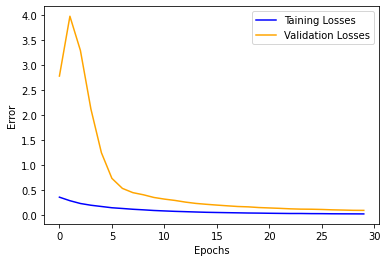

In [ ]:
lr_rate = 3e-4
batch_size = 4

model = smp.Unet(
    encoder_name="resnet50",        # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=1,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=4,                      # model output channels (number of classes in your dataset)
)
model = model.to(device)

learned_model = train_and_validate(model ,device, optim.Adam(model.parameters(),lr = lr_rate), 30, batch_size,  learning_rate=lr_rate)

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr199.png


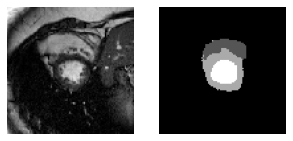

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr150.png


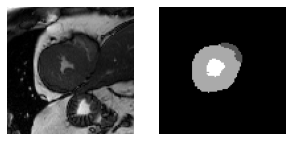

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr146.png


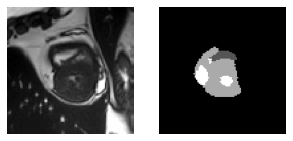

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr174.png


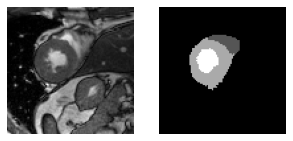

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr176.png


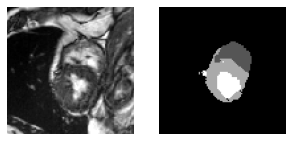

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr198.png


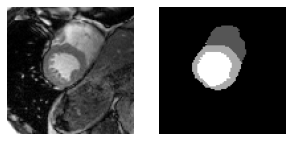

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr191.png


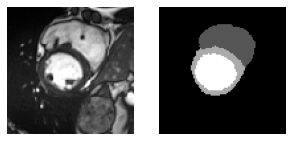

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr153.png


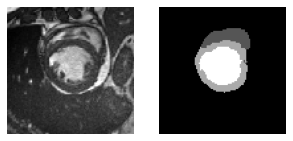

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr175.png


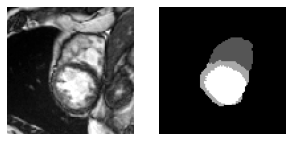

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr165.png


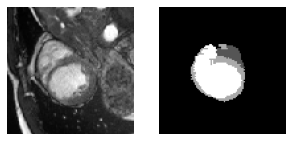

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr152.png


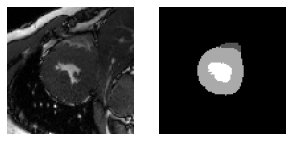

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr140.png


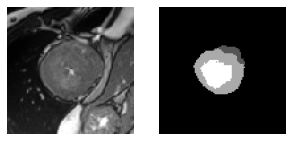

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr130.png


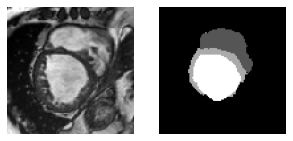

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr144.png


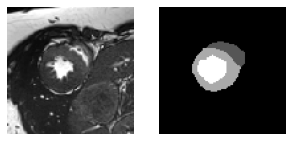

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr143.png


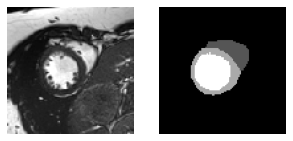

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr192.png


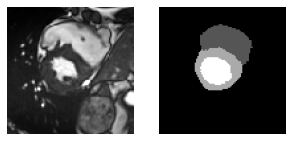

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr164.png


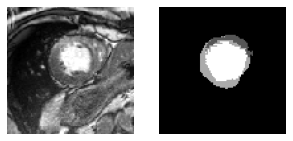

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr157.png


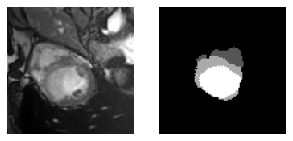

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr166.png


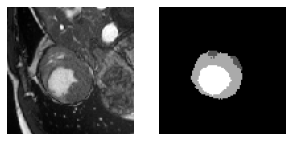

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr151.png


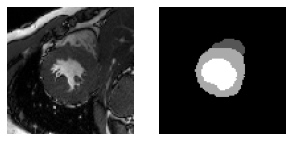

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr147.png


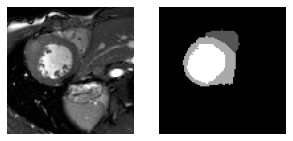

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr171.png


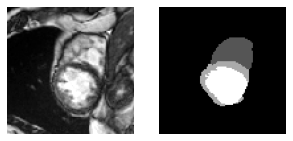

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr149.png


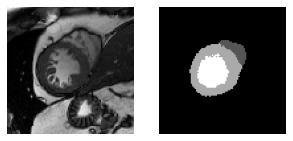

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr180.png


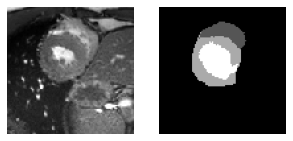

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr200.png


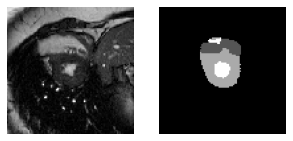

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr121.png


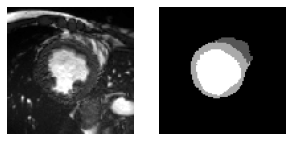

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr160.png


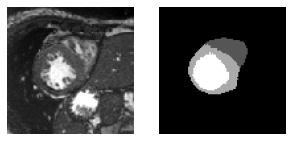

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr179.png


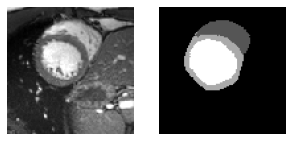

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr125.png


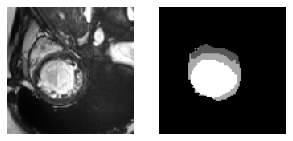

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr195.png


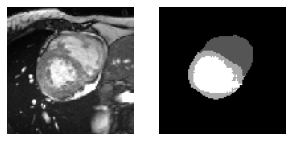

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr161.png


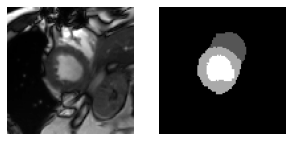

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr188.png


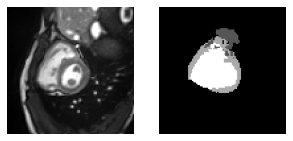

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr167.png


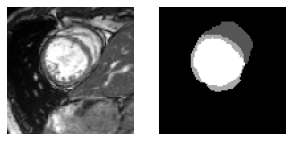

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr154.png


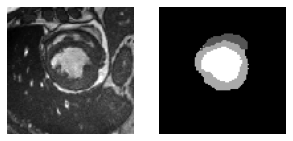

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr131.png


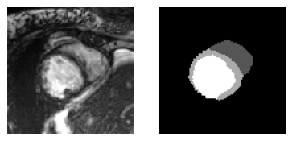

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr132.png


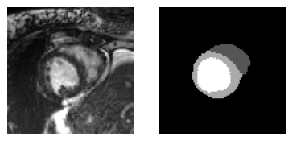

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr127.png


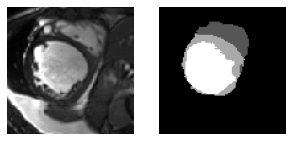

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr138.png


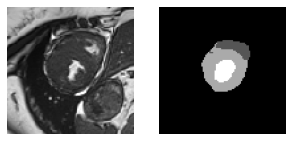

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr124.png


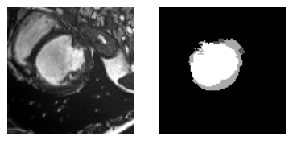

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr142.png


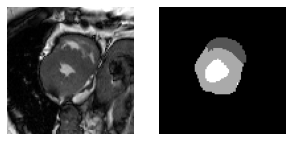

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr185.png


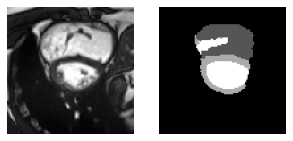

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr148.png


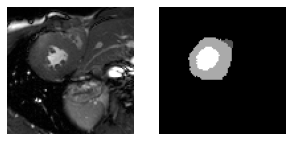

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr190.png


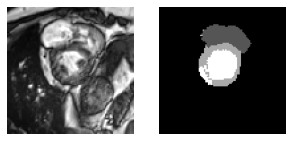

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr194.png


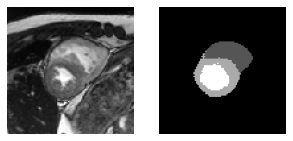

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr187.png


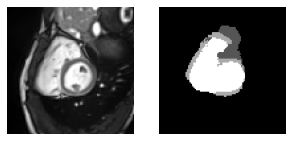

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr181.png


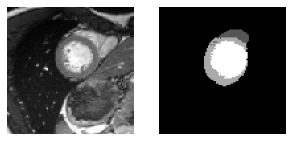

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr173.png


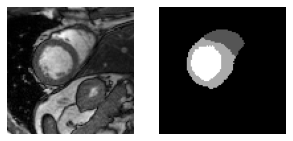

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr136.png


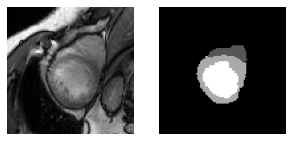

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr129.png


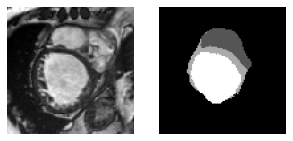

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr141.png


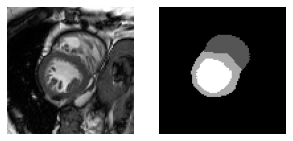

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr159.png


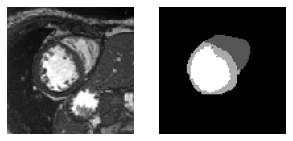

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr196.png


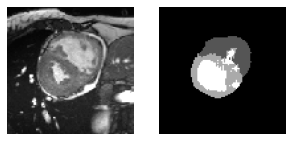

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr155.png


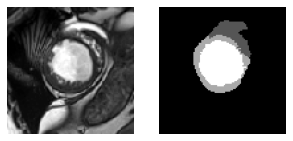

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr126.png


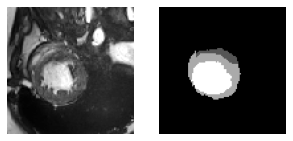

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr197.png


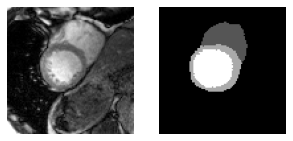

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr128.png


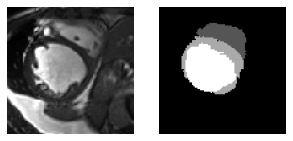

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr189.png


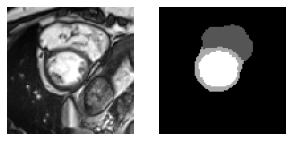

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr158.png


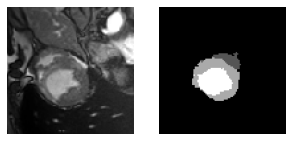

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr162.png


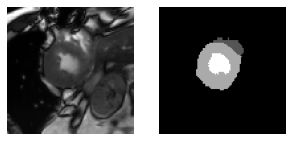

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr170.png


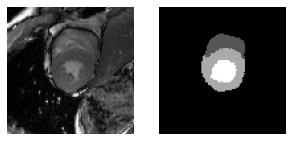

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr122.png


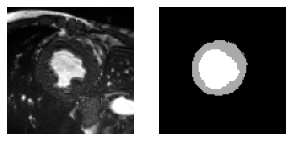

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr172.png


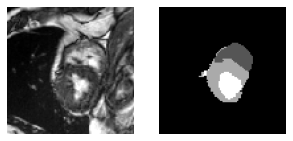

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr178.png


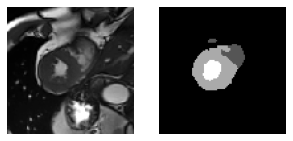

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr193.png


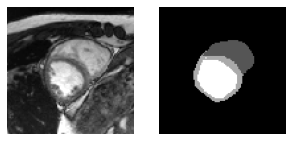

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr168.png


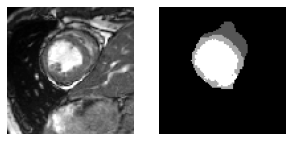

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr184.png


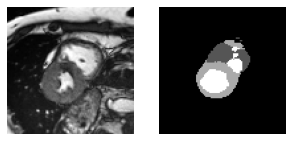

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr135.png


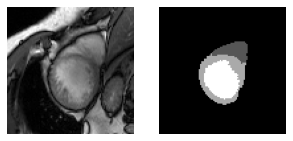

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr145.png


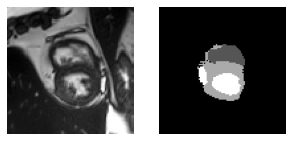

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr163.png


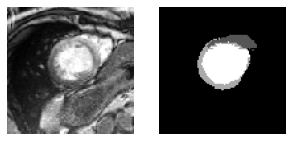

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr134.png


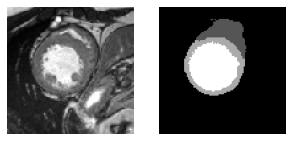

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr156.png


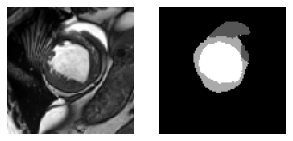

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr186.png


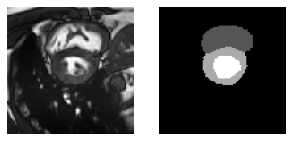

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr137.png


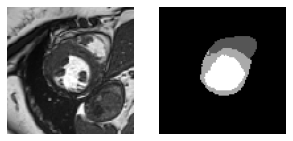

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr182.png


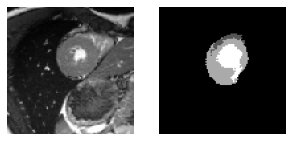

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr169.png


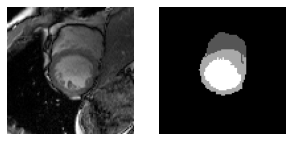

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr133.png


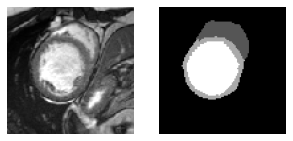

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr177.png


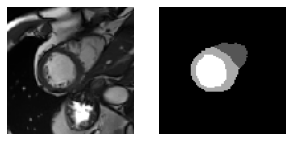

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr183.png


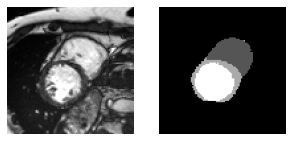

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr123.png


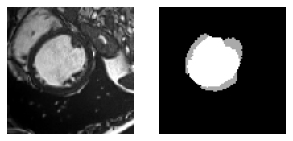

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr139.png


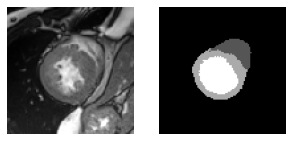

In [ ]:
#In this block you are expected to write code to load saved model and deploy it to all data in test set to 
# produce segmentation masks in png images valued 0,1,2,3, which will be used for the submission to Kaggle.
import re
from torchvision.utils import save_image
data_path = '/content/drive/MyDrive/data/test/'
num_workers = 2
batch_size = 1

learned_model = learned_model.to(device)
test_set = TestDataset(data_path)
test_data_loader = DataLoader(dataset=test_set, num_workers=num_workers,batch_size=batch_size, shuffle=False)
learned_model.eval()
for iteration, sample in enumerate(test_data_loader):
    img,img_pth = sample
    #print(img.shape)
    print(img.size())
    img = img.unsqueeze(1)
    print(img.size())
    img = img.to(device)
    out = learned_model(img)
    out_np = torch.max(out,1).indices.cpu().detach().numpy()
    image_np = img.cpu().detach().numpy()
    print(img_pth[0])
   # print(re.split(r'\/',img_pth[0]))
    #img_pth = re.split(r'\/',img_pth[0])
    #print(img_pth)
    #path = os.path.join('',img_pth[-1])
    #print(path)  
    #path=path[:6]
    #print(path)
    #cv2.imwrite('/mask/' + path, out)
    dir_to_save = '/content/mask_UNET/'
    for i in range(1):
            show_image_mask(image_np[i,0], out_np[i], cmap='gray')
            plt.pause(1)
            image_name = img_pth[i].split('/')[-1].split('.')[0]+'_mask.png'
            #print(image_name,os.path.join(output_test_mask_path,image_name))
            cv2.imwrite(os.path.join(dir_to_save,image_name),out_np[0])

**Observation:-** Predictions were better than the previous experiments. After submission we achieved a score of 72%.

### 3.2.5 Transfer learning approach:- Retraining UNET model with RESNET 34 encoder and ImageNet weights and later testing it.

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 1 		 Training Loss: 0.31540157198905944 		 Validation Loss: 1.2042052507400514
Epoch 2 		 Training Loss: 0.2527777701616287 		 Validation Loss: 1.6976792097091675
Epoch 3 		 Training Loss: 0.20383716225624085 		 Validation Loss: 1.4871392488479613
Epoch 4 		 Training Loss: 0.16676635444164276 		 Validation Loss: 1.0630097389221191
Epoch 5 		 Training Loss: 0.1376368820667267 		 Validation Loss: 0.8104228019714356
Epoch 6 		 Training Loss: 0.11744314283132554 		 Validation Loss: 0.6072645902633667
Epoch 7 		 Training Loss: 0.10096424072980881 		 Validation Loss: 0.45072308778762815
Epoch 8 		 Training Loss: 0.0878660649061203 		 Validation Loss: 0.38837614059448244
Epoch 9 		 Training Loss: 0.07971147000789643 		 Validation Loss: 0.3387264907360077
Epoch 10 		 Training Loss: 0.07005001008510589 		 Validation Loss: 0.3054649829864502
Epoch 11 		 Training Loss: 0.06705654412508011 		 Validation Loss: 0.274322921037674
Epoch 12 		 Training Loss: 0.05945781767368317 		 Validation Loss

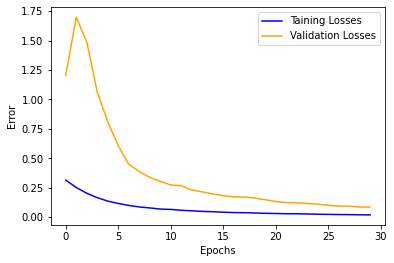

In [ ]:
lr_rate = 3e-4
batch_size = 4

model = smp.Unet(
    encoder_name="resnet34",        # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=1,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=4,                      # model output channels (number of classes in your dataset)
)
model = model.to(device)

learned_model = train_and_validate(model ,device, optim.Adam(model.parameters(),lr = lr_rate), 30, batch_size,  learning_rate=lr_rate)

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr199.png


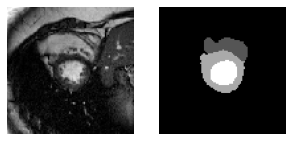

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr150.png


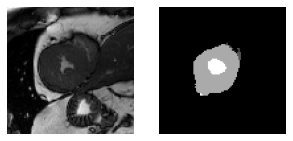

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr146.png


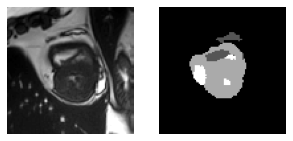

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr174.png


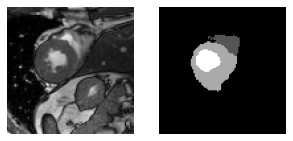

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr176.png


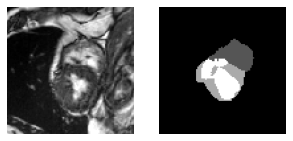

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr198.png


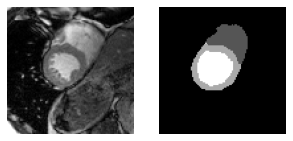

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr191.png


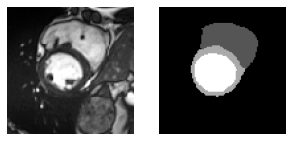

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr153.png


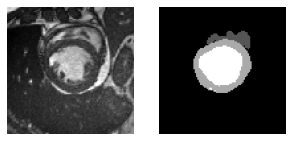

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr175.png


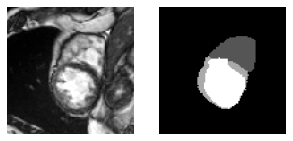

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr165.png


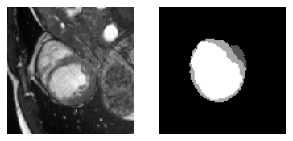

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr152.png


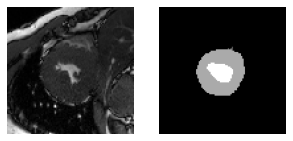

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr140.png


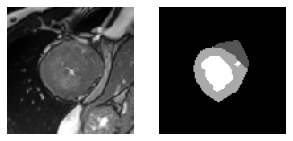

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr130.png


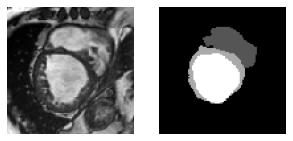

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr144.png


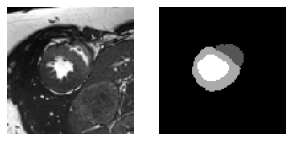

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr143.png


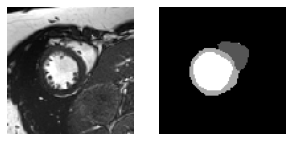

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr192.png


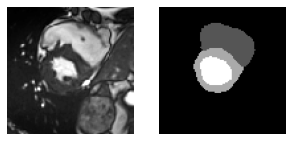

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr164.png


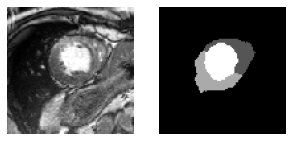

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr157.png


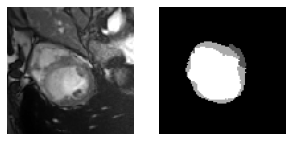

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr166.png


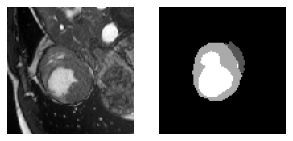

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr151.png


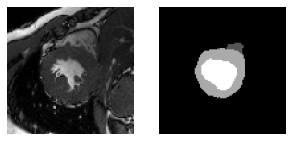

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr147.png


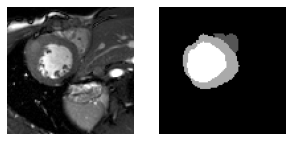

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr171.png


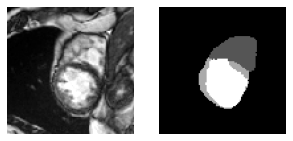

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr149.png


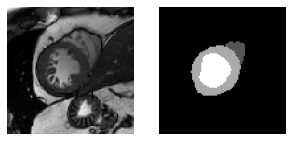

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr180.png


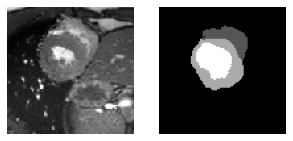

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr200.png


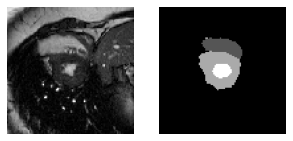

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr121.png


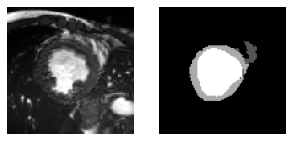

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr160.png


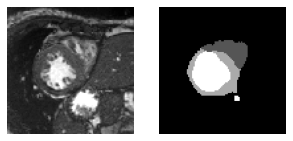

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr179.png


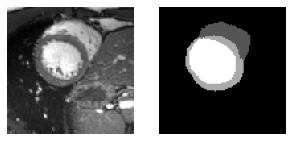

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr125.png


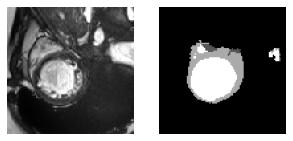

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr195.png


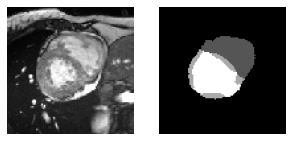

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr161.png


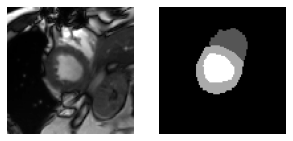

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr188.png


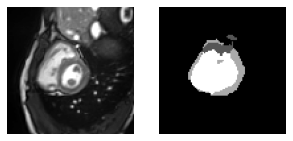

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr167.png


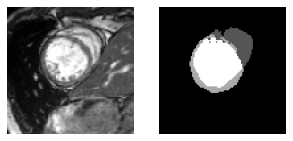

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr154.png


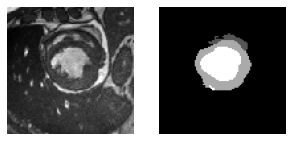

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr131.png


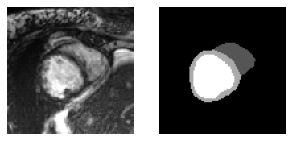

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr132.png


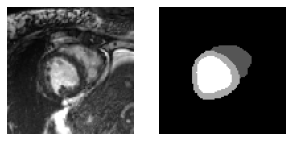

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr127.png


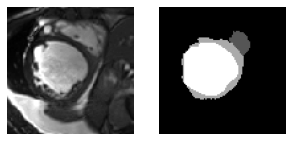

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr138.png


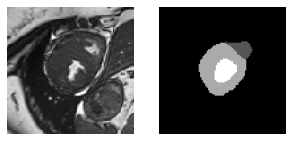

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr124.png


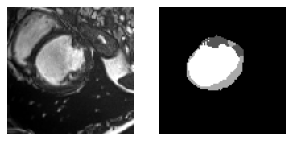

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr142.png


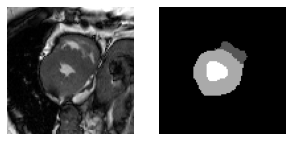

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr185.png


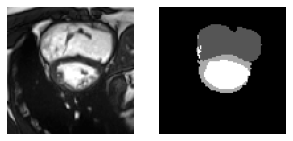

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr148.png


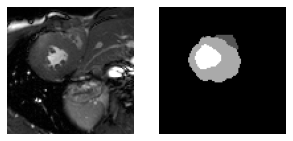

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr190.png


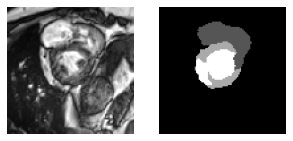

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr194.png


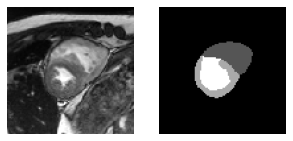

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr187.png


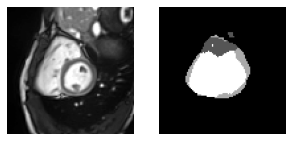

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr181.png


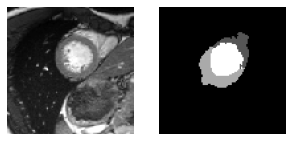

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr173.png


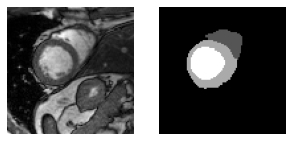

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr136.png


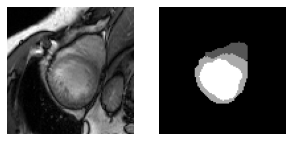

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr129.png


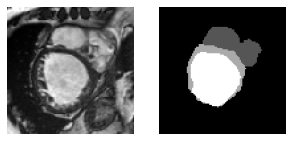

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr141.png


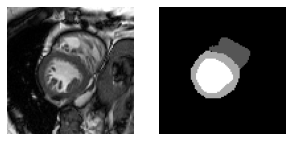

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr159.png


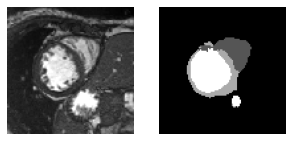

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr196.png


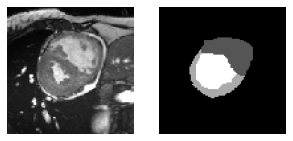

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr155.png


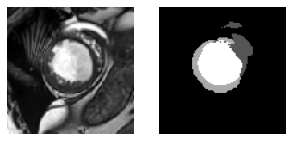

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr126.png


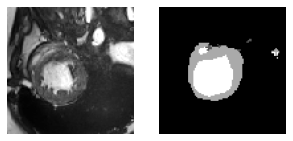

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr197.png


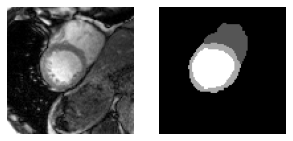

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr128.png


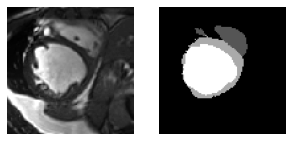

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr189.png


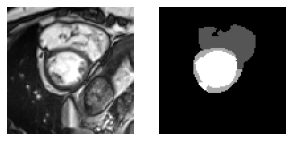

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr158.png


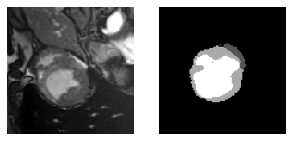

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr162.png


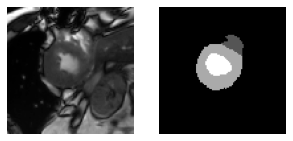

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr170.png


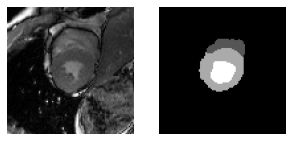

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr122.png


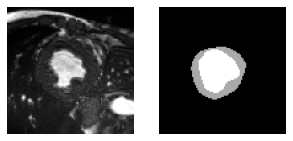

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr172.png


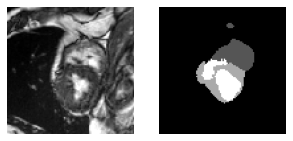

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr178.png


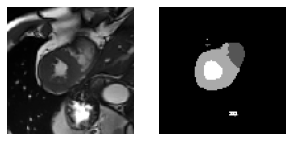

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr193.png


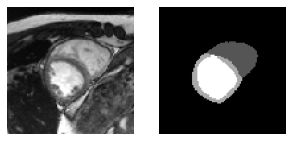

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr168.png


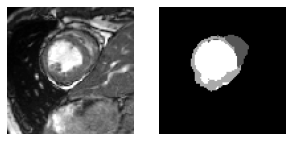

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr184.png


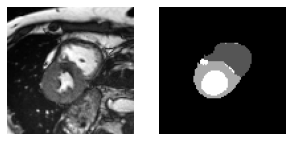

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr135.png


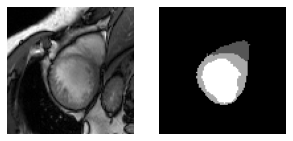

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr145.png


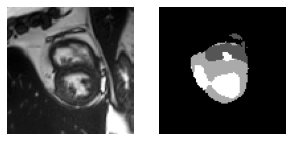

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr163.png


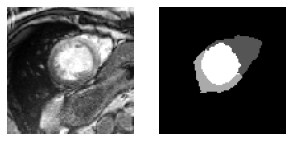

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr134.png


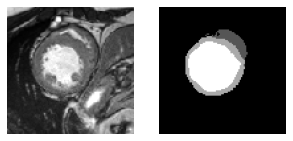

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr156.png


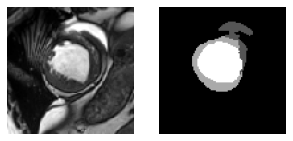

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr186.png


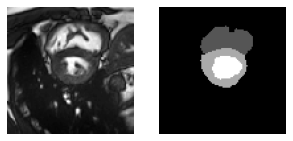

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr137.png


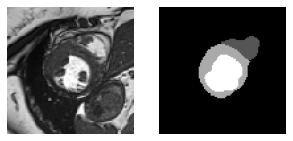

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr182.png


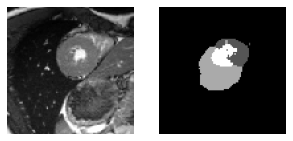

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr169.png


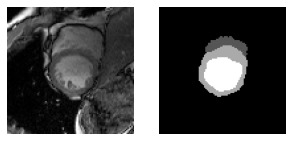

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr133.png


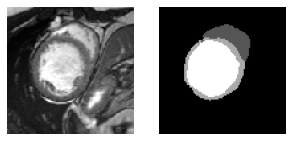

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr177.png


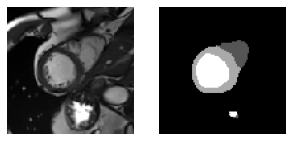

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr183.png


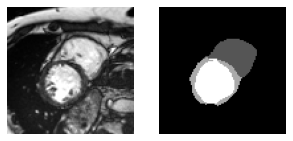

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr123.png


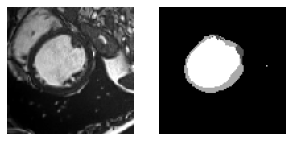

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr139.png


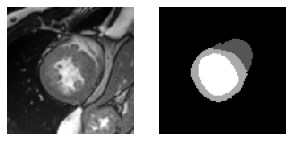

In [ ]:
#In this block you are expected to write code to load saved model and deploy it to all data in test set to 
# produce segmentation masks in png images valued 0,1,2,3, which will be used for the submission to Kaggle.
import re
from torchvision.utils import save_image
data_path = '/content/drive/MyDrive/data/test/'
num_workers = 2
batch_size = 1

learned_model = learned_model.to(device)
test_set = TestDataset(data_path)
test_data_loader = DataLoader(dataset=test_set, num_workers=num_workers,batch_size=batch_size, shuffle=False)
learned_model.eval()
for iteration, sample in enumerate(test_data_loader):
    img,img_pth = sample
    #print(img.shape)
    print(img.size())
    img = img.unsqueeze(1)
    print(img.size())
    img = img.to(device)
    out = learned_model(img)
    out_np = torch.max(out,1).indices.cpu().detach().numpy()
    image_np = img.cpu().detach().numpy()
    print(img_pth[0])
   # print(re.split(r'\/',img_pth[0]))
    #img_pth = re.split(r'\/',img_pth[0])
    #print(img_pth)
    #path = os.path.join('',img_pth[-1])
    #print(path)  
    #path=path[:6]
    #print(path)
    #cv2.imwrite('/mask/' + path, out)
    dir_to_save = '/content/mask_UNET/'
    for i in range(1):
            show_image_mask(image_np[i,0], out_np[i], cmap='gray')
            plt.pause(1)
            image_name = img_pth[i].split('/')[-1].split('.')[0]+'_mask.png'
            #print(image_name,os.path.join(output_test_mask_path,image_name))
            cv2.imwrite(os.path.join(dir_to_save,image_name),out_np[0])

*Visual inspection of Test and its inference*:- We observed that the prediciton 
were good but the kaggle score obtained was only 68%. This puts the model comaprison as follows :
RESNET 34 < ADAPTED UNET2 < RESNET 50

To improve the scores we further explore Transfer learning models. Efficient Net B4 is a lightweight model which was capable for solving our purpose.

### 3.2.6 Transfer learning approach:- Retraining UNET model with EFFICIENTNET B4 encoder and ImageNet weights and later testing it.


Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b4-6ed6700e.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b4-6ed6700e.pth


  0%|          | 0.00/74.4M [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 1 		 Training Loss: 0.4382996678352356 		 Validation Loss: 3.0816431045532227
Epoch 2 		 Training Loss: 0.38233416676521303 		 Validation Loss: 2.600347566604614
Epoch 3 		 Training Loss: 0.33940049409866335 		 Validation Loss: 2.5245697021484377
Epoch 4 		 Training Loss: 0.2979529440402985 		 Validation Loss: 2.752825927734375
Epoch 5 		 Training Loss: 0.2604406774044037 		 Validation Loss: 2.690469264984131
Epoch 6 		 Training Loss: 0.22230279445648193 		 Validation Loss: 2.2017097949981688
Epoch 7 		 Training Loss: 0.19217994511127473 		 Validation Loss: 1.6137445211410522
Epoch 8 		 Training Loss: 0.16914029717445372 		 Validation Loss: 1.2333738803863525
Epoch 9 		 Training Loss: 0.14942259788513185 		 Validation Loss: 1.0359495401382446
Epoch 10 		 Training Loss: 0.13597926497459412 		 Validation Loss: 0.9110016822814941
Epoch 11 		 Training Loss: 0.12160425484180451 		 Validation Loss: 0.7513067126274109
Epoch 12 		 Training Loss: 0.11102824807167053 		 Validation Loss: 0.

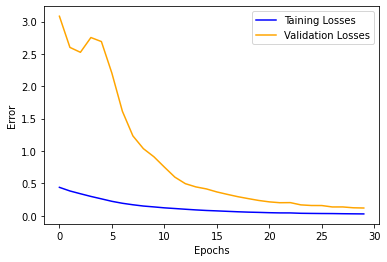

In [ ]:
lr_rate = 3e-4
batch_size = 4
model = smp.Unet(
    encoder_name="efficientnet-b4",        # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=1,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=4,                      # model output channels (number of classes in your dataset)
)

model = model.to(device)

learned_model = train_and_validate(model ,device, optim.Adam(model.parameters(),lr = lr_rate), 30, batch_size,  learning_rate=lr_rate)

testing the above model

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr199.png


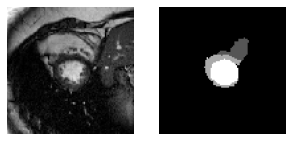

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr150.png


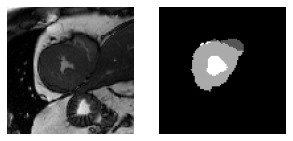

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr146.png


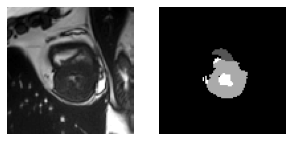

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr174.png


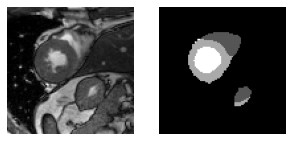

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr176.png


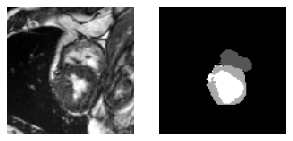

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr198.png


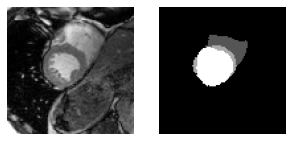

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr191.png


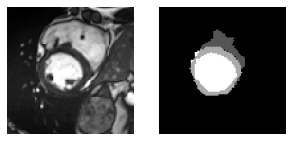

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr153.png


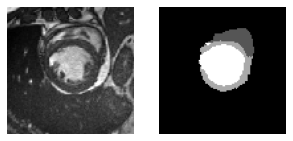

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr175.png


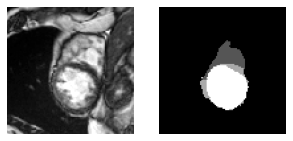

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr165.png


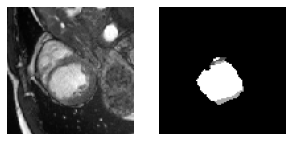

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr152.png


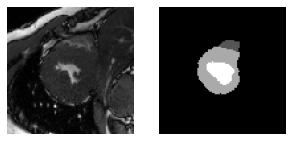

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr140.png


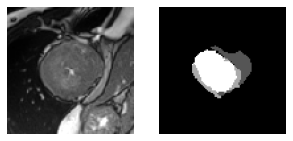

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr130.png


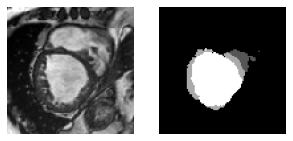

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr144.png


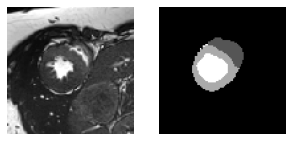

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr143.png


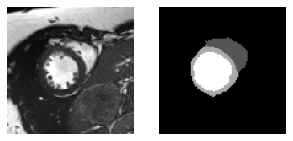

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr192.png


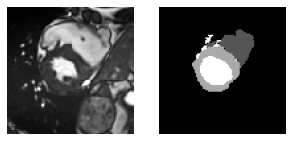

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr164.png


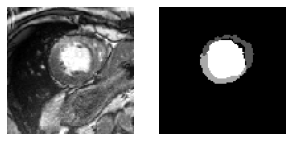

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr157.png


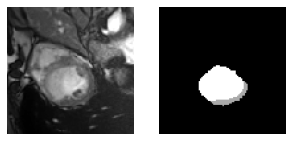

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr166.png


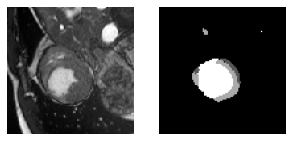

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr151.png


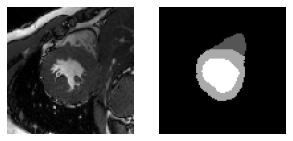

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr147.png


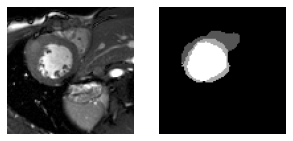

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr171.png


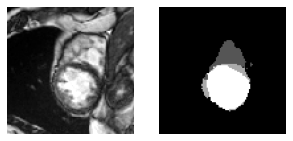

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr149.png


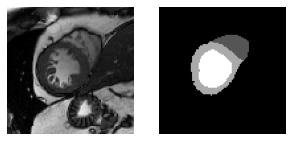

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr180.png


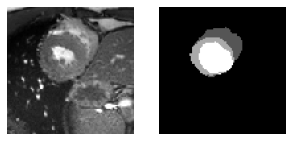

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr200.png


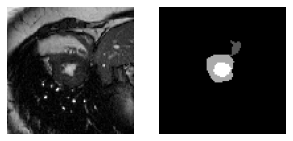

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr121.png


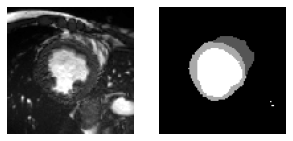

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr160.png


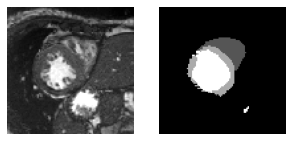

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr179.png


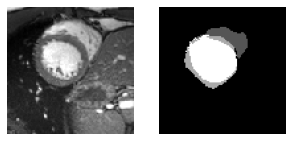

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr125.png


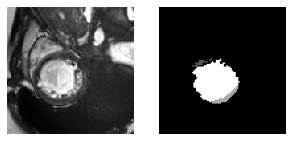

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr195.png


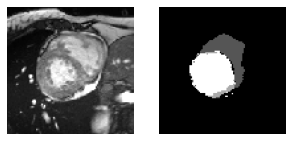

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr161.png


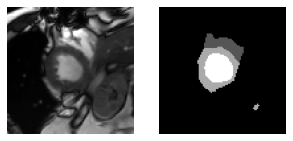

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr188.png


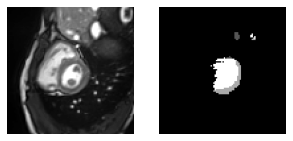

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr167.png


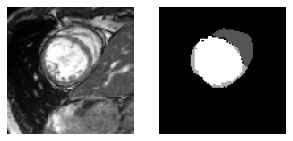

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr154.png


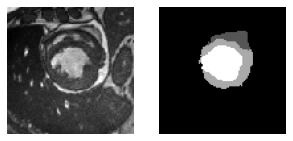

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr131.png


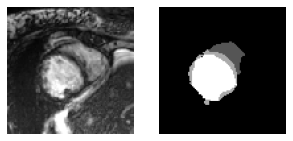

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr132.png


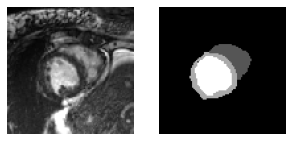

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr127.png


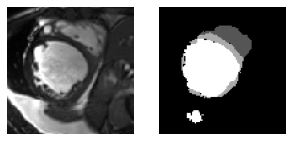

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr138.png


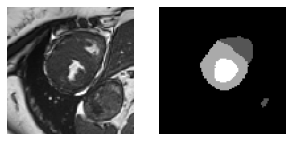

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr124.png


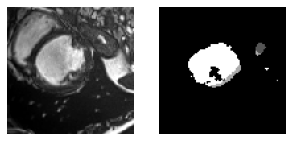

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr142.png


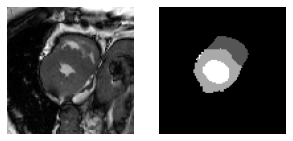

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr185.png


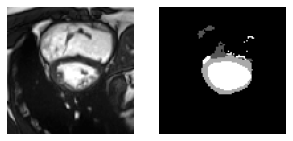

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr148.png


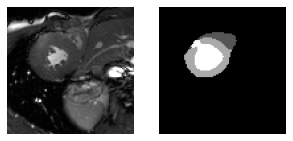

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr190.png


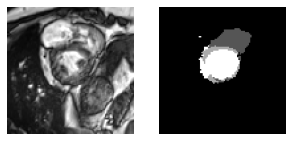

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr194.png


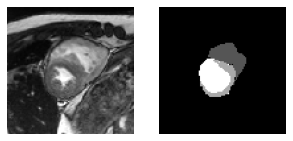

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr187.png


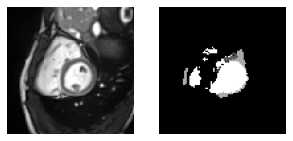

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr181.png


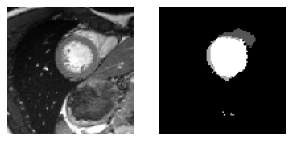

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr173.png


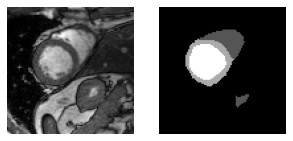

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr136.png


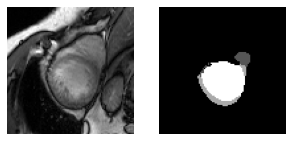

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr129.png


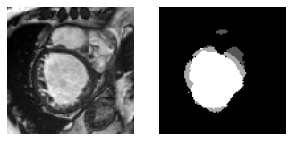

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr141.png


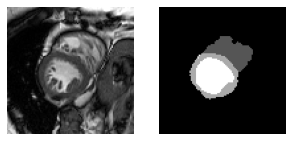

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr159.png


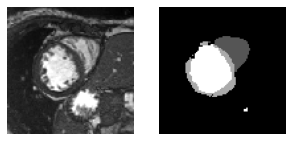

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr196.png


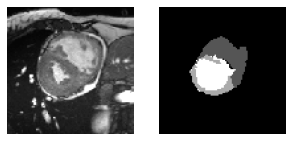

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr155.png


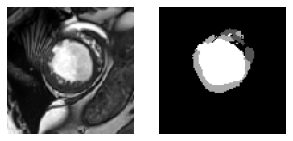

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr126.png


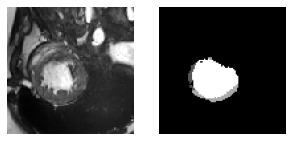

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr197.png


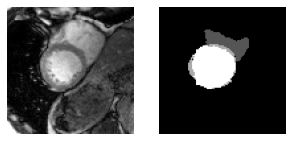

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr128.png


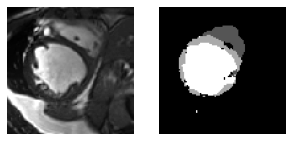

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr189.png


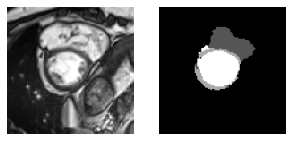

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr158.png


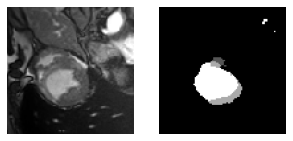

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr162.png


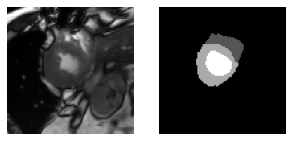

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr170.png


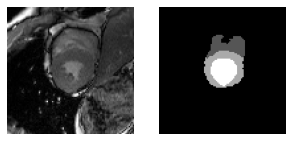

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr122.png


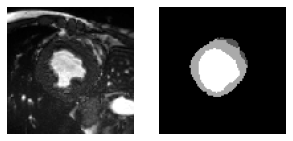

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr172.png


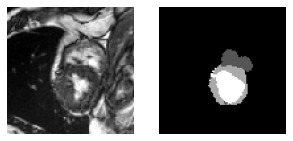

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr178.png


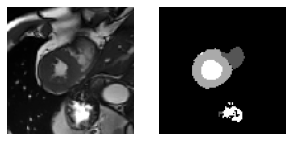

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr193.png


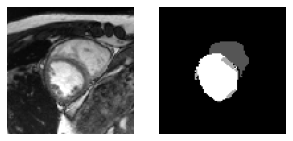

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr168.png


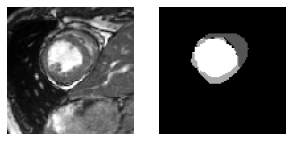

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr184.png


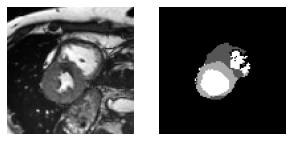

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr135.png


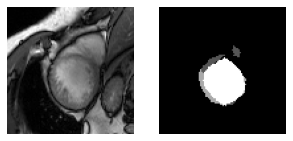

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr145.png


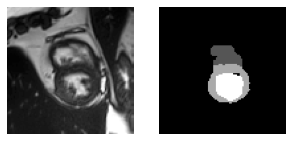

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr163.png


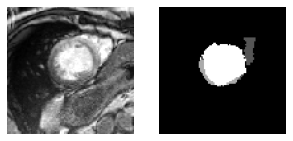

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr134.png


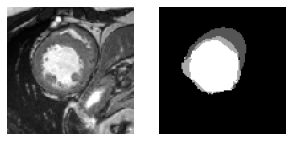

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr156.png


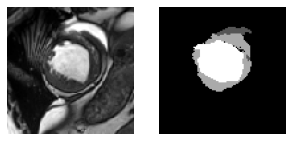

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr186.png


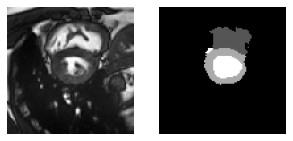

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr137.png


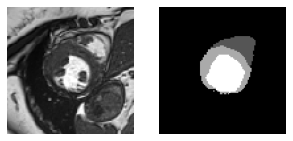

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr182.png


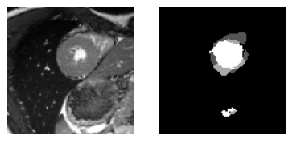

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr169.png


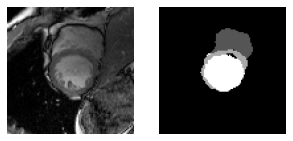

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr133.png


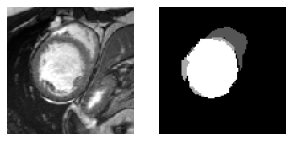

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr177.png


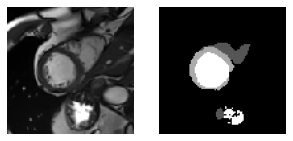

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr183.png


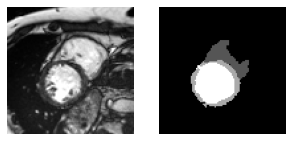

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr123.png


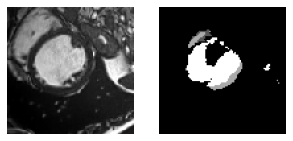

torch.Size([1, 96, 96])
torch.Size([1, 1, 96, 96])
/content/drive/MyDrive/data/test/image/cmr139.png


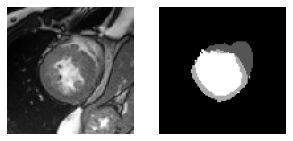

In [ ]:
#In this block you are expected to write code to load saved model and deploy it to all data in test set to 
# produce segmentation masks in png images valued 0,1,2,3, which will be used for the submission to Kaggle.
import re
from torchvision.utils import save_image
data_path = '/content/drive/MyDrive/data/test/'
num_workers = 2
batch_size = 1

learned_model = learned_model.to(device)
test_set = TestDataset(data_path)
test_data_loader = DataLoader(dataset=test_set, num_workers=num_workers,batch_size=batch_size, shuffle=False)
learned_model.eval()
for iteration, sample in enumerate(test_data_loader):
    img,img_pth = sample
    #print(img.shape)
    print(img.size())
    img = img.unsqueeze(1)
    print(img.size())
    img = img.to(device)
    out = learned_model(img)
    out_np = torch.max(out,1).indices.cpu().detach().numpy()
    image_np = img.cpu().detach().numpy()
    print(img_pth[0])
   # print(re.split(r'\/',img_pth[0]))
    #img_pth = re.split(r'\/',img_pth[0])
    #print(img_pth)
    #path = os.path.join('',img_pth[-1])
    #print(path)  
    #path=path[:6]
    #print(path)
    #cv2.imwrite('/mask/' + path, out)
    dir_to_save = '/content/mask_EFFNET/'
    for i in range(1):
            show_image_mask(image_np[i,0], out_np[i], cmap='gray')
            plt.pause(1)
            image_name = img_pth[i].split('/')[-1].split('.')[0]+'_mask.png'
            #print(image_name,os.path.join(output_test_mask_path,image_name))
            cv2.imwrite(os.path.join(dir_to_save,image_name),out_np[0])

## Loss Function
For training our models until now, we have been using the standard CrossEntropy loss provided by pytorch. However, the loss mostly became stagnant after a certain number of epochs and the training wasn't proceeding any further. Different optimizers were also used such as Adam, RMSprop, SGD, Adagrad etc. with different learning rates and other hyperparameters but there seemed to be no effect on the training loss. On exploring other loss functions for segmentation tasks, we came across another Loss function - [DiceLoss](ref:https://smp.readthedocs.io/en/latest/losses.html#diceloss) - from the same Segmentation library where we got our pretrained model. Using the log_loss (-log(dice_coeff)) mode of the multiclass dice loss, we were able to learn and reduce the loss even more when we started training on the best model trained using CrossEntropy loss. One other reason for choosing this loss function is that the final evaluation is going to be done using dice loss. 

# 4.Conclusion
For the final submission, based on the above experimentaion and observation we take into consideration the following points:

1. Pretrained models perform better than models with random weights. We therefore choose a pretrained model from segmentation library with effnet-b4 encoder weights.
2. Multiclass Dice Loss enables more learning as compared to CrossEntropy loss. We therefore choose to refine the model based on dice loss rather than the Cross Entropy loss.
3. We also see that image augmentation during training boosts our training accuracy and also helps in generalization of the training dataset to accomodate various angles, flips, and scales etc.

To conclude we observed that transfer learning approach with EfficientNet-b4 with pretrained weights from ImageNet produced the best model for our problem with very limited amount of dataset. Our strategy of first making a custom model from scratch gave us a very good intuition on how data and model performed which led us to do a lot of experiments and this ultimately led us to select the best model.

# 5.The code for concise implementaiton of the training, validation and testing based on the final submitted model on kaggle.

## 5.1 Transfer Learning with Data Augmentation, Unet with EfficientNetB4 encoder.


In [ ]:
import segmentation_models_pytorch as smp

model = smp.Unet(
    encoder_name="efficientnet-b4",        # choose encoder,
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=1,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=4,                      # model output channels (number of classes in your dataset)
)


In [ ]:
import time
model.to(device)

data_path = '/content/drive/MyDrive/data/train/'
num_workers = 4
batch_size = 5
train_set = TrainDatasetModified(data_path)  #Using augmented training set
training_data_loader = DataLoader(dataset=train_set, num_workers=num_workers, batch_size=batch_size, shuffle=True) 

#loss_fn = torch.nn.CrossEntropyLoss()
loss_fn = smp.losses.DiceLoss('multiclass', classes=None, log_loss=True, from_logits=True, smooth=0.0, ignore_index=None, eps=1e-07)   #using multiclass dice loss instead of cross entropy
train_loss=[]
model.train()
#opt_sgd = torch.optim.SGD(model.parameters(), lr=0.0001, momentum=0.9)
opt = torch.optim.Adam(model.parameters(), lr=0.0008)
for epoch in range(60):  # loop over the dataset 

    running_loss = 0.0
    for image,mask in training_data_loader:
        
        image.to(device)
        mask.to(device)
        image = image.to(device)
        mask = mask.to(device)
        out = model(image)
        loss = loss_fn(out,mask.long())
        opt.zero_grad()
        loss.backward()
        opt.step()
        running_loss += (loss.item()/batch_size)
        
    train_loss.append(running_loss)
    print('Train loss for epoch:',epoch,' : ',train_loss)
    if epoch%10 == 0:
        torch.save(model,'u-effb4_chckpnt.pth')
    
        

torch.save(model,'u-effb4.pth')
print('Finished Training. model saved')

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


0.2921519392728806  - loss for epoch:  0
0.15949515402317047  - loss for epoch:  1
0.0802654504776001  - loss for epoch:  2
0.04687826722860336  - loss for epoch:  3
0.03901374250650406  - loss for epoch:  4
0.03232879459857941  - loss for epoch:  5
0.02664587363600731  - loss for epoch:  6
0.024653092920780183  - loss for epoch:  7
0.02524708040058613  - loss for epoch:  8
0.02513972334563732  - loss for epoch:  9
0.021720579415559767  - loss for epoch:  10
0.020081487447023393  - loss for epoch:  11
0.021805455908179283  - loss for epoch:  12
0.020860862135887146  - loss for epoch:  13
0.019561957791447638  - loss for epoch:  14
0.018671310767531396  - loss for epoch:  15
0.019088890254497528  - loss for epoch:  16
0.018980738297104834  - loss for epoch:  17
0.02084140993654728  - loss for epoch:  18
0.01839221954345703  - loss for epoch:  19
0.01610504314303398  - loss for epoch:  20
0.015530462600290776  - loss for epoch:  21
0.015354174524545669  - loss for epoch:  22
0.0147888682

The current device is cuda:0
CE loss score for image :  0.3763372600078583
d_loss for class  3  :  0.9213055685298269


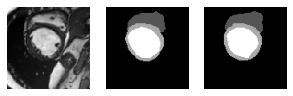

CE loss score for image :  0.34332698583602905
d_loss for class  3  :  0.9157561777718967


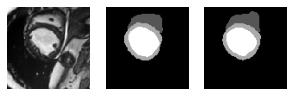

CE loss score for image :  0.28626716136932373
d_loss for class  3  :  0.9184765665635196


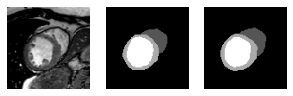

CE loss score for image :  0.8085256218910217
d_loss for class  3  :  0.6056913376613565


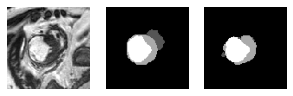

CE loss score for image :  0.32271257042884827
d_loss for class  3  :  0.860587785015154


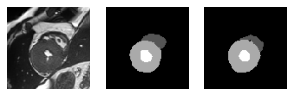

CE loss score for image :  0.09561297297477722
d_loss for class  3  :  0.9499535948055701


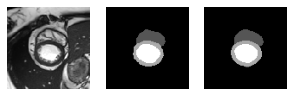

CE loss score for image :  0.13236087560653687
d_loss for class  3  :  0.9450245931038009


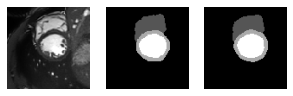

CE loss score for image :  0.2305460274219513
d_loss for class  3  :  0.9186849653200474


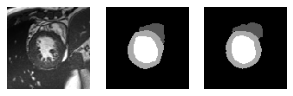

CE loss score for image :  0.47671666741371155
d_loss for class  3  :  0.8696508148419957


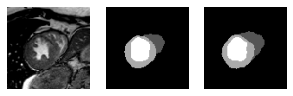

CE loss score for image :  0.13642171025276184
d_loss for class  3  :  0.9487434838320268


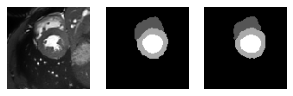

CE loss score for image :  0.2743098735809326
d_loss for class  3  :  0.8341503873602814


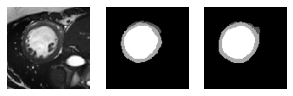

CE loss score for image :  0.22529686987400055
d_loss for class  3  :  0.943056226421389


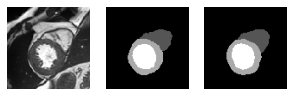

CE loss score for image :  0.2965157926082611
d_loss for class  3  :  0.904350096206649


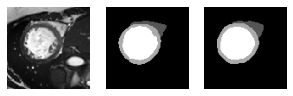

CE loss score for image :  0.4628961384296417
d_loss for class  3  :  0.8766046205594602


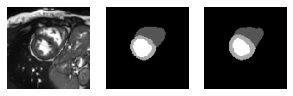

CE loss score for image :  0.8934884667396545
d_loss for class  3  :  0.7957298564451935


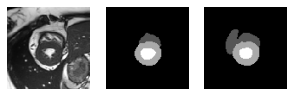

CE loss score for image :  0.10859278589487076
d_loss for class  3  :  0.9476874873888644


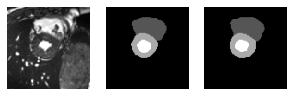

CE loss score for image :  0.29864251613616943
d_loss for class  3  :  0.8820054539599133


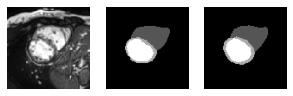

CE loss score for image :  0.4441089332103729
d_loss for class  3  :  0.8191214660707556


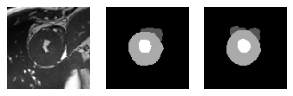

CE loss score for image :  0.4384462237358093
d_loss for class  3  :  0.8346626641423738


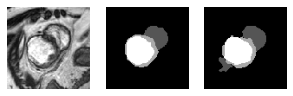

CE loss score for image :  0.29125285148620605
d_loss for class  3  :  0.9162594646296749


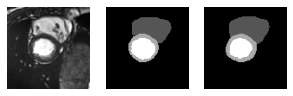

Val_score :  0.8803751305314874


In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"The current device is {device}")
#model=torch.load('unet-res50_opt_3.pth')
#model.to(device)
loss_fn = torch.nn.CrossEntropyLoss()

num_workers = 4
batch_size = 1
data_path='/content/drive/MyDrive/data/val/'
val_set = ValDatasetModified(data_path)
training_data_loader = DataLoader(dataset=val_set, num_workers=num_workers, batch_size=batch_size, shuffle=True)
print('')
model.eval()
total_val_score=0
for image,mask in training_data_loader:
        #print(image.shape,mask.shape)
        image = image.to(device)
        mask = mask.to(device)
        out = model(image)
        loss = loss_fn(out,mask.long())
        print('CrossEntropy loss score for image : ',loss.item())
        
        out_np = torch.max(out,1).indices.cpu().detach().numpy()
        mask_np = mask.cpu().detach().numpy()
        image_np = image.cpu().detach().numpy()
        #print(out_np[0].shape,mask_np.shape)
        d_score=0
        for j in range(1,4):
            d_score += categorical_dice(mask_np[0], out_np[0],j)
        total_val_score += d_score/3
        for i in range(1):
            show_image_mask_mask(image_np[i,0],mask_np[i], out_np[i], cmap='gray')
            plt.pause(1)
print("Val_score : ",total_val_score/20)
        

The current device is cuda:0


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


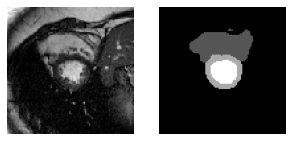

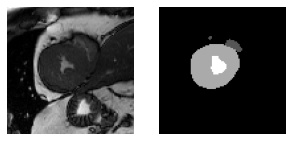

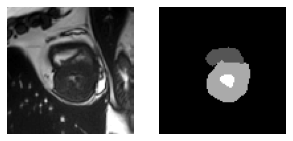

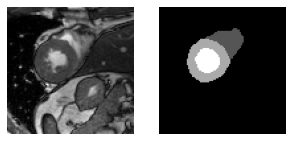

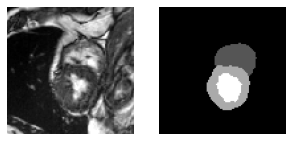

...

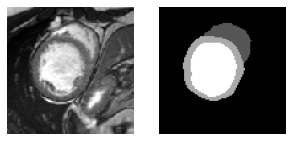

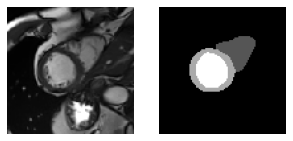

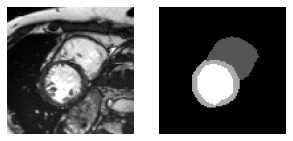

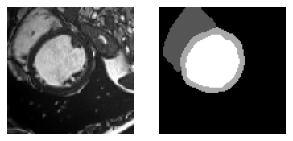

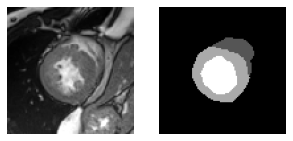

In [ ]:
# Load final model
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"The current device is {device}")

model=torch.load('u-effb4_100.pth')
model.to(device)

model.eval()

input_test_data_path = '/content/drive/MyDrive/data/test/'
output_test_mask_path='/content/mask_EFFNET/'
num_workers = 4
batch_size = 1



test_set = TestDatasetModified(input_test_data_path)
test_data_loader = DataLoader(dataset=test_set, num_workers=num_workers,batch_size=batch_size, shuffle=False)

    
for image,img_paths in test_data_loader:
        image = image.to(device)
        out = model(image)
        out_np = torch.max(out,1).indices.cpu().detach().numpy()
        image_np = image.cpu().detach().numpy()
        for i in range(batch_size):
            show_image_mask(image_np[i,0],out_np[i], cmap='gray')
            plt.pause(1)
            image_name = img_paths[i].split('/')[-1].split('.')[0]+'_mask.png'
            #print(image_name,os.path.join(output_test_mask_path,image_name))
            cv2.imwrite(os.path.join(output_test_mask_path,image_name),out_np[0])

In [ ]:
import numpy as np
import os
import cv2

def rle_encoding(x):
    '''
    *** Credit to https://www.kaggle.com/rakhlin/fast-run-length-encoding-python ***
    x: numpy array of shape (height, width), 1 - mask, 0 - background
    Returns run length as list
    '''
    dots = np.where(x.T.flatten() == 1)[0]
    run_lengths = []
    prev = -2
    for b in dots:
        if (b > prev + 1): run_lengths.extend((b + 1, 0))
        run_lengths[-1] += 1
        prev = b
    return run_lengths


def submission_converter(mask_directory, path_to_save):
    writer = open(os.path.join(path_to_save, "submission.csv"), 'w')
    writer.write('id,encoding\n')

    files = os.listdir(mask_directory)

    for file in files:
        name = file[:-4]
        mask = cv2.imread(os.path.join(mask_directory, file), cv2.IMREAD_UNCHANGED)

        mask1 = (mask == 1)
        mask2 = (mask == 2)
        mask3 = (mask == 3)

        encoded_mask1 = rle_encoding(mask1)
        encoded_mask1 = ' '.join(str(e) for e in encoded_mask1)
        encoded_mask2 = rle_encoding(mask2)
        encoded_mask2 = ' '.join(str(e) for e in encoded_mask2)
        encoded_mask3 = rle_encoding(mask3)
        encoded_mask3 = ' '.join(str(e) for e in encoded_mask3)

        writer.write(name + '1,' + encoded_mask1 + "\n")
        writer.write(name + '2,' + encoded_mask2 + "\n")
        writer.write(name + '3,' + encoded_mask3 + "\n")

    writer.close()

submission_converter('/content/mask_EFFNET/','/content/Submission')

# 6.References

1. Olaf Ronneberger, Philipp Fischer, and Thomas Brox.  U-Net: Convolutional Networks for Biomedical Image Segmentation 
URL: https://link.springer.com/content/pdf/10.1007/978-3-319-24574-4_28.pdf accessed on Nov 20,2021
2. URL: https://github.com/qubvel/segmentation_models.pytorch accessed on Nov 26,2021
3. URL: https://github.com/albumentations-team/albumentations accessed on Nov 27,2021
4. URL: https://smp.readthedocs.io/en/latest/losses.html#diceloss accessed on Nov 12,2021

5. Buslaev, A.; Iglovikov, V.I.; Khvedchenya, E.; Parinov, A.; Druzhinin, M.; Kalinin, A.A. Albumentations: Fast and Flexible Image Augmentations. Information 2020, 11, 125. https://doi.org/10.3390/info11020125

6. Ronneberger, O., Fischer, P., & Brox, T. (2015, October). U-net: Convolutional networks for biomedical image segmentation. In International Conference on Medical image computing and computer-assisted intervention (pp. 234-241). Springer, Cham.

7. Alex Krizhevsky, Ilya Sutskever, and Geoffrey E. Hinton. 2017. ImageNet classification with deep convolutional neural networks. Commun. ACM 60, 6 (June 2017), 84–90. DOI:https://doi.org/10.1145/3065386

8. Krizhevsky, A., Sutskever, I., & Hinton, G. E. (2012). Imagenet classification with deep convolutional neural networks. Advances in neural information processing systems, 25, 1097-1105.

9. Kingma, D. P., & Ba, J. (2014). Adam: A method for stochastic optimization. arXiv preprint arXiv:1412.6980.

10. LeCun, Y., Bengio, Y., & Hinton, G. (2015). Deep learning. nature, 521(7553), 436-444.

11. Tan, M., & Le, Q. (2019, May). Efficientnet: Rethinking model scaling for convolutional neural networks. In International Conference on Machine Learning (pp. 6105-6114). PMLR.

12. He, K., Zhang, X., Ren, S., & Sun, J. (2016). Deep residual learning for image recognition. In Proceedings of the IEEE conference on computer vision and pattern recognition (pp. 770-778).

13. URL: https://towardsdatascience.com/understanding-semantic-segmentation-with-unet-6be4f42d4b47 accessed on Nov 15,2021

14. URL: https://towardsdatascience.com/4-pre-trained-cnn-models-to-use-for-computer-vision-with-transfer-learning-885cb1b2dfc accessed on Nov 26,2021
15. URL: https://github.com/usuyama/pytorch-unet accessed on Nov 19,2021
16. URL: https://www.analyticsvidhya.com/blog/2021/03/introduction-to-batch-normalization/ accessed on Nov 24,2021
17. URL: https://cs231n.github.io/transfer-learning/ acccessed on Nov 26,2021



